# **Stage 2: Data Augmentation Methods**

#### **Overview**

This stage implements the four augmentation methods we explore, demontrate them and creates the augmented testsets with 1:1 ratio to original RAVDNESS data.
In the end, the baseline models is evaluated uppon these sets.This stage implements the four augmentation methods we explore, demonstrates them, and creates the augmented test sets in a 1:1 ratio to the original RAVDNESS data. In the end, the baseline models are evaluated upon these sets.

#### **Workflow**
The implementation follows a structured pipeline consisting of the following stages:
1. **General Preparation**: Environment setup, package imports, and dataset accessibility.  
2. **Loading RAVDNESS Train and Test Sets**: Dataset saved loading
3. **Augmentation Methods**: Time-Stretch, Additive Noise, SpecAugment and N-CP implementation and demonstration.
4. **Creation of All Test Datasets (Augmented)**: Augmented datasets creation for each method with sampled parameters.
5. **Baseling Performance Analysis on Augmented Testsets**: Assessing the model's accuracy and analyzing results across different test conditions.**5b - Shortcut to evluation** - loading the model and test on all sets.

## 1. General Preparation

In [1]:
# Install required packages
%%capture
!pip install datasets transformers evaluate accelerate torch
!pip install torch torchaudio

Import some common libraries

In [2]:
import time
from tqdm import tqdm
import os
import random
import pandas as pd
import numpy as np
from datasets import Dataset

import matplotlib.pyplot as plt
import seaborn as sns

import torch
from torch.optim import AdamW
from torch.utils.data import DataLoader
from sklearn.metrics import classification_report, confusion_matrix
from sklearn.model_selection import train_test_split
from transformers import Wav2Vec2FeatureExtractor, HubertForSequenceClassification

import soundfile as sf
import IPython.display as ipd
import librosa
import librosa.display
from IPython.display import Audio

Use GPU Facilities

In [3]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
device

device(type='cuda')

Set Seed for Reproducibility

In [4]:
SEED = 42

def set_seeds(seed=42):
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    np.random.seed(seed)
    random.seed(seed)
    torch.backends.cudnn.deterministic = True
    torch.backends.cudnn.benchmark = False

set_seeds(SEED)


Google Drive



In [5]:
from google.colab import drive
drive.mount('/content/drive')
BASE_DIR = "/content/drive/MyDrive/YourProject"

Mounted at /content/drive


## 2. Loading RAVDNESS Train and Test Sets

In [ ]:
def load_dataset(dataset_name, set_type, base_dir=f"{BASE_DIR}/Datasets"):
    """Load dataset from the organized structure"""
    metadata_path = os.path.join(base_dir, dataset_name, set_type, 'metadata.pkl')

    if os.path.exists(metadata_path):
        return pd.read_pickle(metadata_path)
    else:
        raise FileNotFoundError(f"Dataset not found at {metadata_path}")

drive_path = f"{BASE_DIR}/Datasets"
train_df = load_dataset('clean', 'train', drive_path)
test_df = load_dataset('clean', 'test', drive_path)

## 3. Augmentation Methods

### Singular sample methods - time-stretch, add-noise, specAugment

In [ ]:
# Augmentation Methods
def time_stretch(audio, rate=1.0):
    return librosa.effects.time_stretch(y=audio, rate=rate)
def add_noise(audio, noise_level=0.005):
    noise = np.random.normal(0, noise_level, audio.shape)
    return audio + noise
def spec_augment(audio, sample_rate, time_mask_param=30, freq_mask_param=10):
    np.random.seed(SEED)  # Ensure reproducibility
    time_mask = np.random.uniform(0, time_mask_param)
    freq_mask = np.random.uniform(0, freq_mask_param)
    augmented_audio = audio.copy()
    # Apply time mask
    if len(audio) > time_mask:
        start = np.random.randint(0, len(audio) - int(time_mask))
        augmented_audio[start: start + int(time_mask)] = 0
    # Apply frequency mask (simulated as scaling random parts of audio)
    if freq_mask < len(audio):
        start = np.random.randint(0, len(audio) - int(freq_mask))
        augmented_audio[start: start + int(freq_mask)] *= 0.5
    return augmented_audio

# Define Fixed Parameters for Each Augmentation
param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}

#### Visualize augmetation methods

In [ ]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import Audio

def visualize_augmentation(audio_path, augmentation_method, params, sample_rate=16000):
    """
    Creates a comprehensive visualization comparing original and augmented audio.
    Uses 16kHz sample rate to match HuBERT's requirements.

    Parameters:
    -----------
    audio_path : str
        Path to the audio file to be analyzed
    augmentation_method : str
        Name of the augmentation method to apply
    params : dict
        Parameters specific to the chosen augmentation method
    sample_rate : int
        Sampling rate for audio processing (default: 16000 Hz for HuBERT)
    """
    # Load the audio file with HuBERT's required sample rate
    audio_original, sr = librosa.load(audio_path, sr=sample_rate)

    # Apply augmentation
    if augmentation_method == "time_stretch":
        rate = params.get('rate', 1.0)
        audio_augmented = time_stretch(audio_original, rate=rate)
    elif augmentation_method == "add_noise":
        noise_level = params.get('noise_level', 0.005)
        audio_augmented = add_noise(audio_original, noise_level)
    elif augmentation_method == "spec_augment":
        time_mask_param = params.get('time_mask_param', 30)
        freq_mask_param = params.get('freq_mask_param', 10)
        audio_augmented = spec_augment(audio_original, sr,
                                     time_mask_param=time_mask_param,
                                     freq_mask_param=freq_mask_param)
    elif augmentation_method == "copy_paste":
        ratio = params.get('ratio', 0.5)
        audio_augmented = copy_paste(audio_original, audio_original, ratio)
    else:
        raise ValueError(f"Unknown augmentation method: {augmentation_method}")

    # Create visualization with time axis in seconds
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))

    # Plot original waveform
    times = np.arange(len(audio_original)) / sr
    librosa.display.waveshow(audio_original, sr=sr, ax=axes[0,0])
    axes[0,0].set_title('Original Waveform')
    axes[0,0].set_xlabel('Time (s)')
    axes[0,0].set_ylabel('Amplitude')

    # Plot original spectrogram
    D = librosa.amplitude_to_db(np.abs(librosa.stft(audio_original)), ref=np.max)
    img = librosa.display.specshow(D, sr=sr, x_axis='time', y_axis='hz', ax=axes[0,1])
    axes[0,1].set_title('Original Spectrogram')
    plt.colorbar(img, ax=axes[0,1], format='%+2.0f dB')

    # Plot augmented waveform
    librosa.display.waveshow(audio_augmented, sr=sr, ax=axes[1,0])
    axes[1,0].set_title(f'Augmented Waveform ({augmentation_method})')
    axes[1,0].set_xlabel('Time (s)')
    axes[1,0].set_ylabel('Amplitude')

    # Plot augmented spectrogram
    D_aug = librosa.amplitude_to_db(np.abs(librosa.stft(audio_augmented)), ref=np.max)
    img_aug = librosa.display.specshow(D_aug, sr=sr, x_axis='time', y_axis='hz', ax=axes[1,1])
    axes[1,1].set_title(f'Augmented Spectrogram ({augmentation_method})')
    plt.colorbar(img_aug, ax=axes[1,1], format='%+2.0f dB')

    plt.tight_layout()

    # Add information about the sample rate
    plt.figtext(0.02, 0.02, f'Sample Rate: {sr} Hz', fontsize=8)

    return fig, audio_original, audio_augmented, sr

def demo_augmentation(df, emotion, augmentation_method, params):
    """
    Demonstrates the effect of audio augmentation on a sample from the dataset.
    Uses HuBERT's required 16kHz sample rate.
    """
    # Select a random sample for the given emotion
    sample = df[df['emotion'] == emotion].sample(1, random_state=42).iloc[0]

    # Create the visualizations and get the audio data
    fig, audio_orig, audio_aug, sr = visualize_augmentation(
        sample['path'],
        augmentation_method,
        params
    )

    # Display the figure
    plt.show()

    # Create audio players for both original and augmented audio
    print("\nOriginal Audio:")
    display(Audio(audio_orig, rate=sr))
    print(f"\nAugmented Audio ({augmentation_method}):")
    display(Audio(audio_aug, rate=sr))

    # Print detailed information
    print(f"\nAudio Information:")
    print(f"Sample Rate: {sr} Hz")
    print(f"Original Duration: {len(audio_orig)/sr:.2f} seconds")
    print(f"Augmented Duration: {len(audio_aug)/sr:.2f} seconds")
    print(f"\nAugmentation Parameters:")
    for param_name, param_value in params.items():
        print(f"{param_name}: {param_value}")

    return fig, audio_orig, audio_aug

**Demo of sad emotion with Time-Stretch Aug**

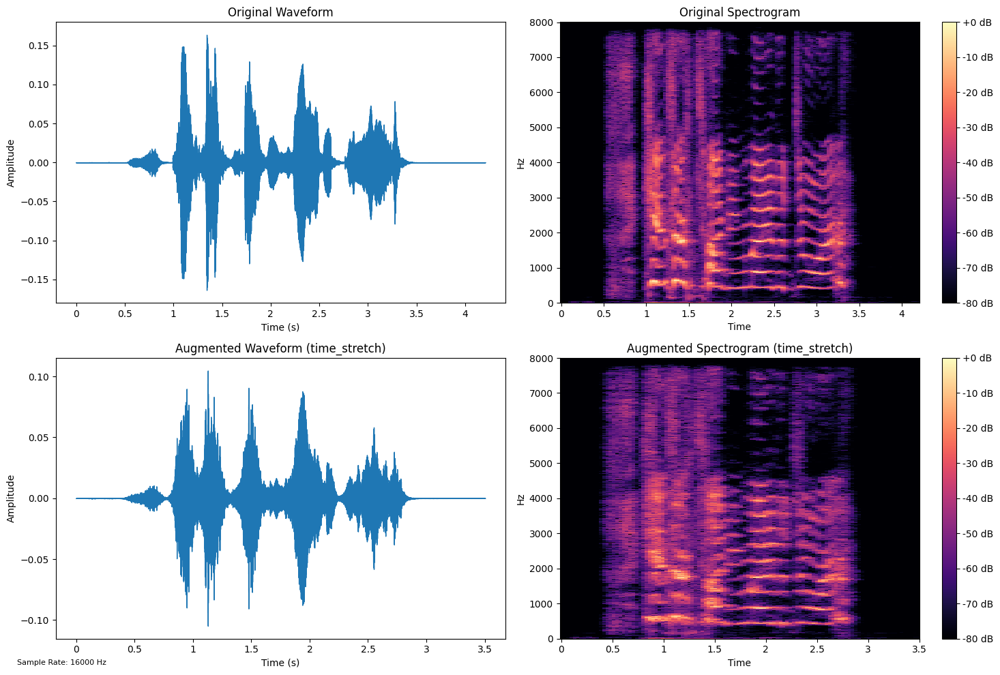


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 4.20 seconds
Augmented Duration: 3.50 seconds

Augmentation Parameters:
rate: 1.2


(<Figure size 1500x1000 with 6 Axes>,
 array([-4.2016564e-11,  1.1534773e-11,  3.2361669e-11, ...,
         1.1207252e-05,  1.5992155e-05,  6.4544583e-06], dtype=float32),
 array([-5.7871603e-08, -7.2017059e-08,  5.3841426e-08, ...,
        -9.0503827e-06,  5.0208787e-06, -5.5615128e-06], dtype=float32))

In [ ]:
demo_augmentation(
    train_df,
    emotion='sad',
    augmentation_method='time_stretch',
    params={'rate': 1.2}
)

 #### Gread search of augmentation methods
 Systematic way to test all augmentation methods across different emotions and parameter ranges.
```s
 param_values = {
    "time_stretch": [0.8, 0.9, 1.0, 1.1, 1.2],
    "add_noise": [0.001, 0.005, 0.01],
    "copy_paste": [0.5, 0.6, 0.7],
    "spec_augment": {
        "time_mask_param": [10, 20, 30],
        "freq_mask_param": [10, 20, 30]
    }
}
```

In [ ]:
import itertools
import pandas as pd
import matplotlib.pyplot as plt
from IPython.display import display, HTML
import time

def test_augmentation_parameters(train_df,
                                 emotions=["happy", "sad", "angry", "neutral", "fear", "disgust", "surprise"],
                                 save_path=None):
    """
    Systematically tests all augmentation methods with their parameter ranges across different emotions.

    Parameters:
    -----------
    train_df : pandas.DataFrame
        The training dataset containing audio samples
    emotions : list
        List of emotions to test (default includes all six emotions)
    save_path : str, optional
        Path to save the visualizations (if None, only displays them)
    """
    # Create a results dictionary to store observations
    results = {
        'emotion': [],
        'augmentation': [],
        'parameters': [],
        'duration': []
    }

    # Testing time_stretch
    print("\n=== Testing Time Stretch Augmentation ===")
    for emotion, rate in itertools.product(emotions, param_values['time_stretch']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Rate: {rate}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='time_stretch',
            params={'rate': rate}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('time_stretch')
        results['parameters'].append(f'rate={rate}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/timestretch_{emotion}_{rate}.png")
        plt.close()

    # Testing add_noise
    print("\n=== Testing Noise Addition Augmentation ===")
    for emotion, noise_level in itertools.product(emotions, param_values['add_noise']):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Noise Level: {noise_level}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='add_noise',
            params={'noise_level': noise_level}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('add_noise')
        results['parameters'].append(f'noise_level={noise_level}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/noise_{emotion}_{noise_level}.png")
        plt.close()

    # Testing spec_augment
    print("\n=== Testing SpecAugment ===")
    for emotion, (time_mask, freq_mask) in itertools.product(
        emotions,
        zip(param_values['spec_augment']['time_mask_param'],
            param_values['spec_augment']['freq_mask_param'])
    ):
        start_time = time.time()
        print(f"\nEmotion: {emotion}, Time Mask: {time_mask}, Freq Mask: {freq_mask}")

        fig, orig, aug = demo_augmentation(
            train_df,
            emotion=emotion,
            augmentation_method='spec_augment',
            params={'time_mask_param': time_mask, 'freq_mask_param': freq_mask}
        )

        duration = time.time() - start_time
        results['emotion'].append(emotion)
        results['augmentation'].append('spec_augment')
        results['parameters'].append(f'time_mask={time_mask}, freq_mask={freq_mask}')
        results['duration'].append(duration)

        if save_path:
            plt.savefig(f"{save_path}/specaugment_{emotion}_{time_mask}_{freq_mask}.png")
        plt.close()

    # Create a summary DataFrame
    results_df = pd.DataFrame(results)

    # Display summary statistics
    print("\n=== Augmentation Testing Summary ===")
    summary = results_df.groupby(['augmentation', 'emotion'])['duration'].agg(['mean', 'std', 'count'])
    display(HTML(summary.to_html()))

    return results_df

Test all augmentations with all parameters and emotions.
Here we demonstrate on 'happy' emotion.


=== Testing Time Stretch Augmentation ===

Emotion: happy, Rate: 0.8


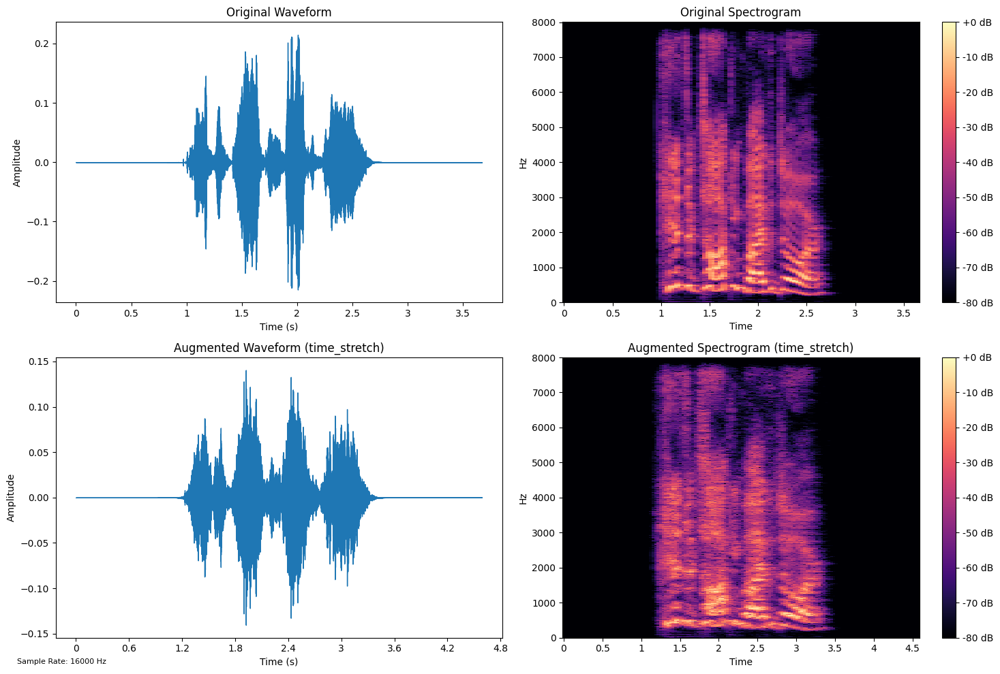


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 4.59 seconds

Augmentation Parameters:
rate: 0.8

Emotion: happy, Rate: 0.9


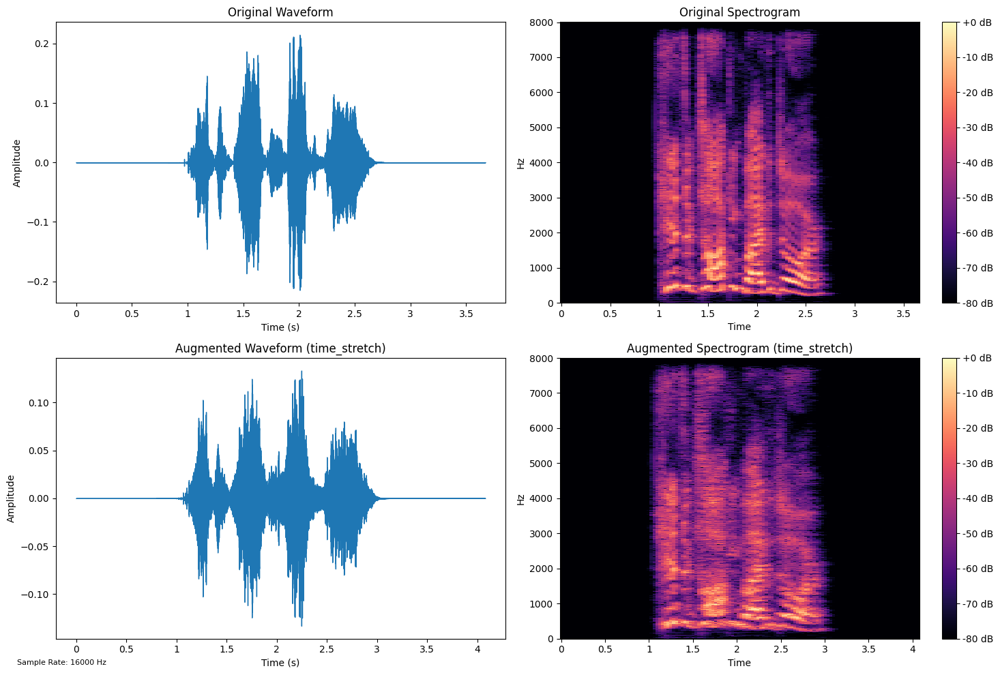


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 4.08 seconds

Augmentation Parameters:
rate: 0.9

Emotion: happy, Rate: 1.0


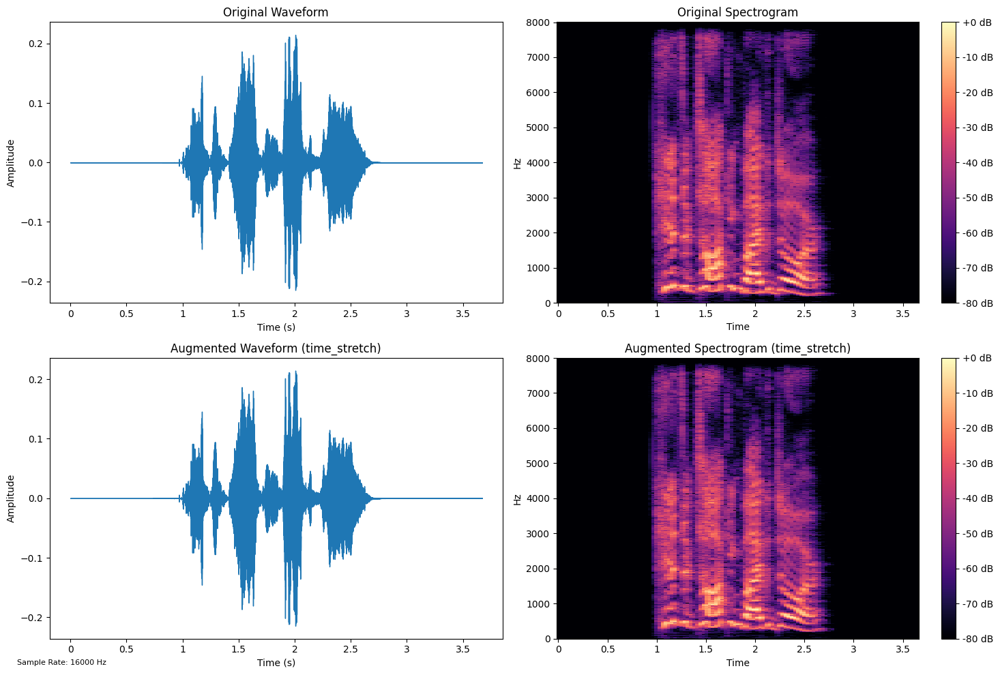


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
rate: 1.0

Emotion: happy, Rate: 1.1


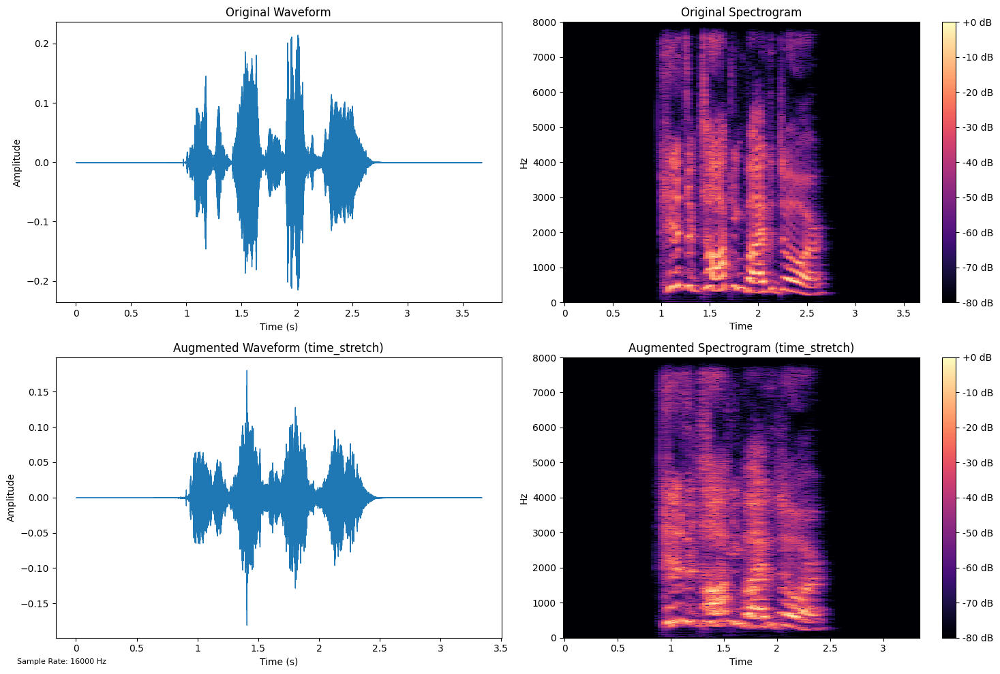


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.34 seconds

Augmentation Parameters:
rate: 1.1

Emotion: happy, Rate: 1.2


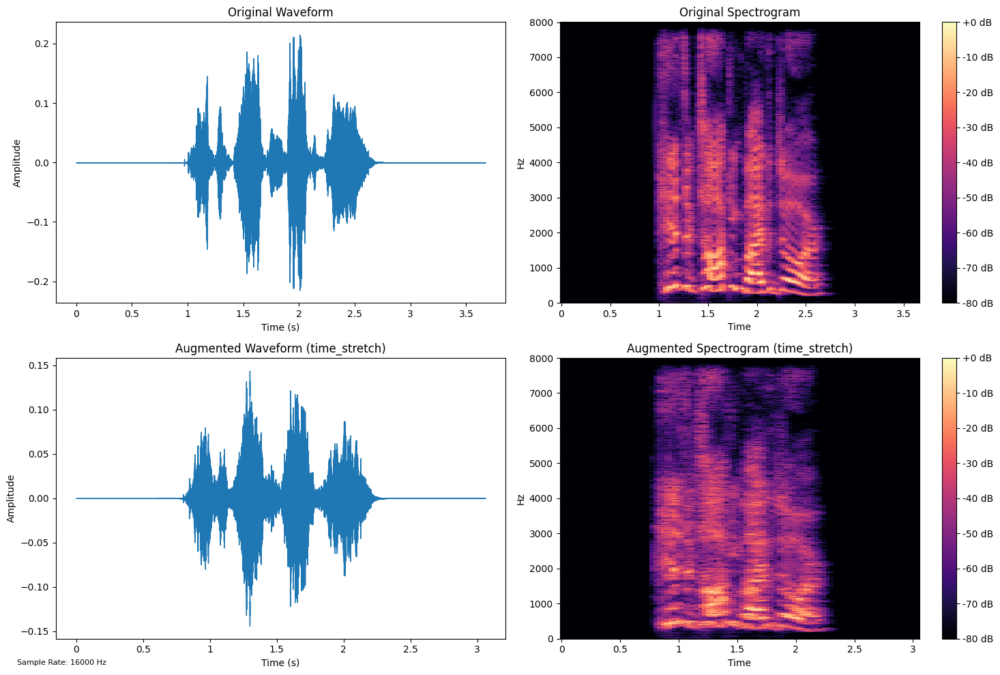


Original Audio:



Augmented Audio (time_stretch):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.06 seconds

Augmentation Parameters:
rate: 1.2

=== Testing Noise Addition Augmentation ===

Emotion: happy, Noise Level: 0.001


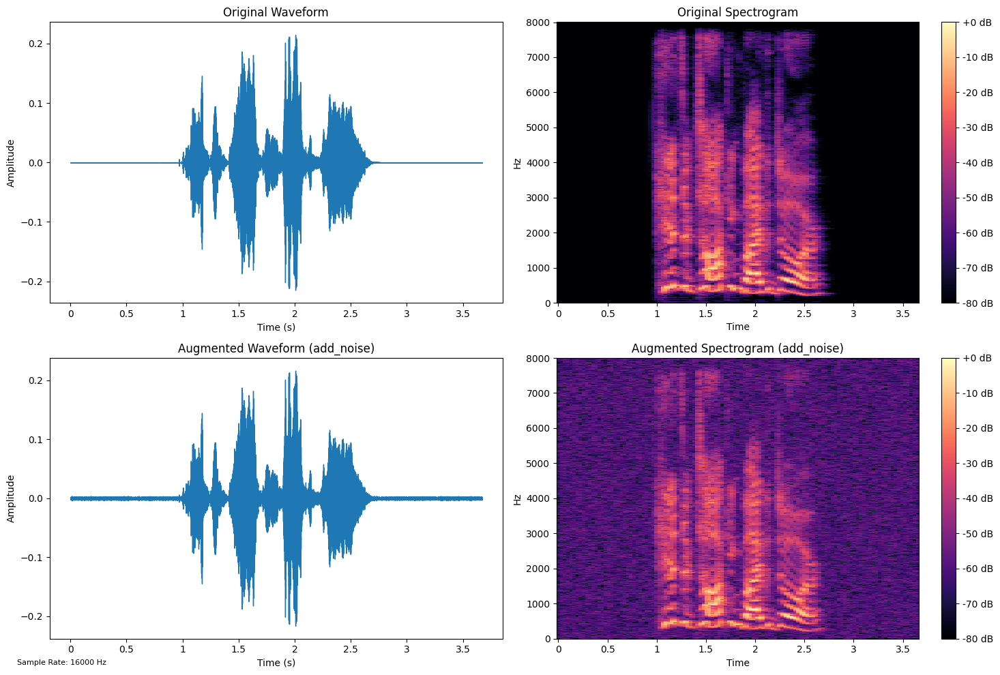


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
noise_level: 0.001

Emotion: happy, Noise Level: 0.005


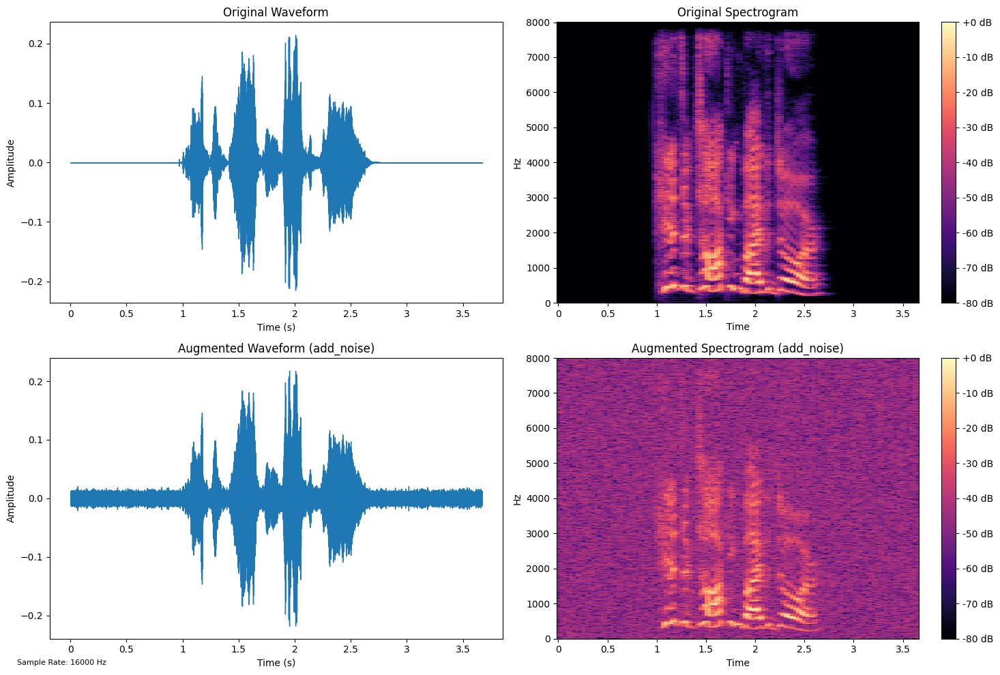


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
noise_level: 0.005

Emotion: happy, Noise Level: 0.01


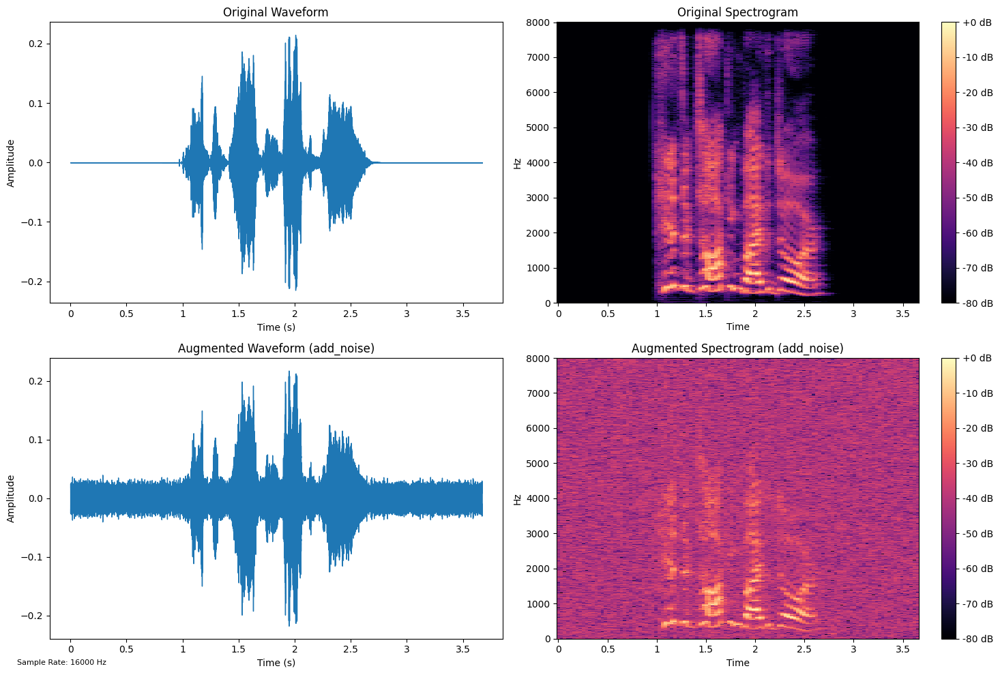


Original Audio:



Augmented Audio (add_noise):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
noise_level: 0.01

=== Testing SpecAugment ===

Emotion: happy, Time Mask: 10, Freq Mask: 10


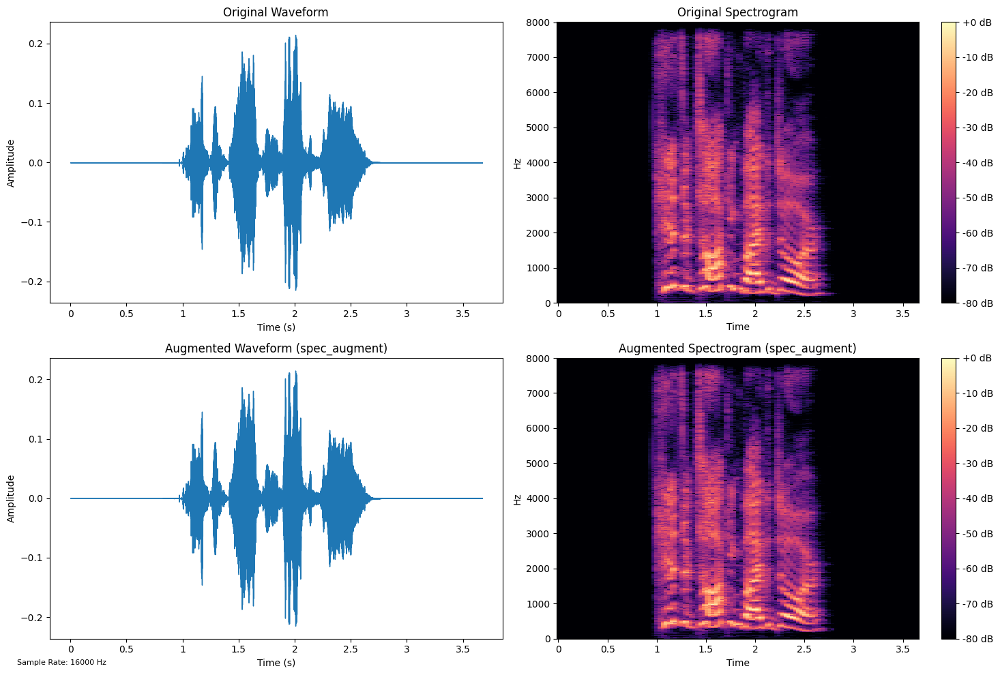


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
time_mask_param: 10
freq_mask_param: 10

Emotion: happy, Time Mask: 20, Freq Mask: 20


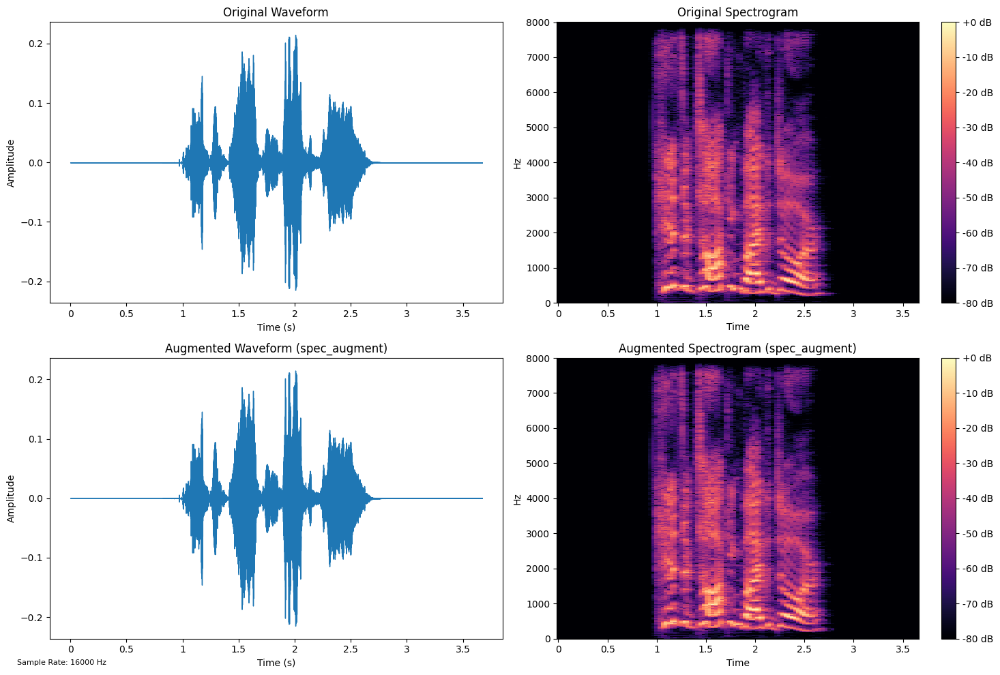


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
time_mask_param: 20
freq_mask_param: 20

Emotion: happy, Time Mask: 30, Freq Mask: 30


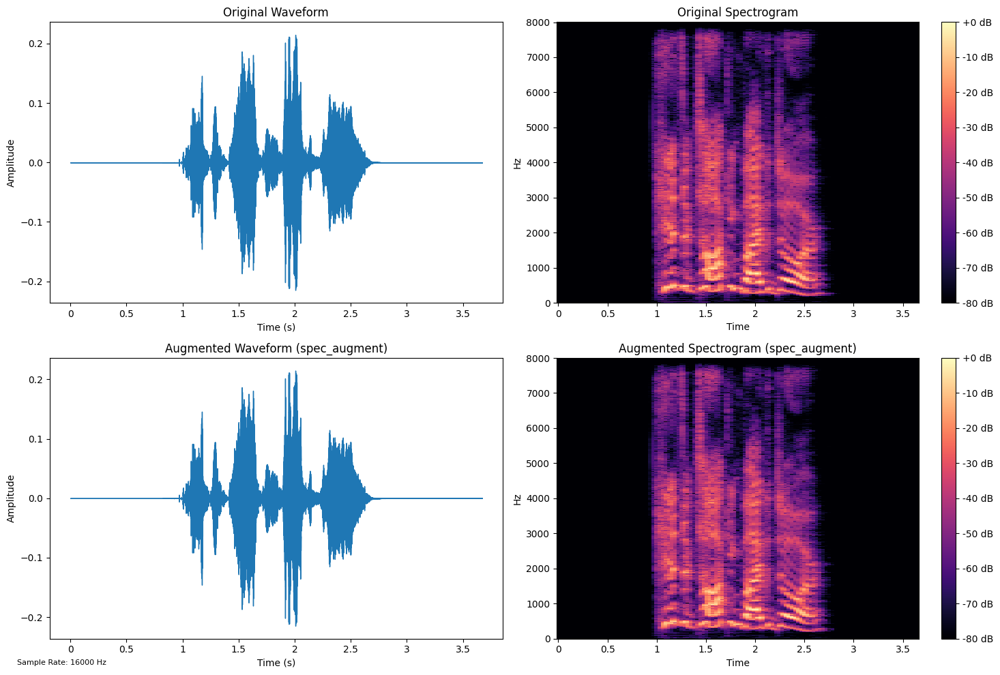


Original Audio:



Augmented Audio (spec_augment):



Audio Information:
Sample Rate: 16000 Hz
Original Duration: 3.67 seconds
Augmented Duration: 3.67 seconds

Augmentation Parameters:
time_mask_param: 30
freq_mask_param: 30

=== Augmentation Testing Summary ===


,,mean,std,count
augmentation,emotion,,,
add_noise,happy,2.064953,0.248530,3
spec_augment,happy,2.236309,0.396381,3
time_stretch,happy,2.172063,0.473686,5


  emotion  augmentation parameters  duration
0   happy  time_stretch   rate=0.8  1.846547
1   happy  time_stretch   rate=0.9  2.971232
2   happy  time_stretch   rate=1.0  2.167069
3   happy  time_stretch   rate=1.1  1.791048
4   happy  time_stretch   rate=1.2  2.084418


In [ ]:
results = test_augmentation_parameters(
    train_df,
    emotions=['happy']
)

# The results DataFrame contains timing and parameter information
print(results.head())

### N-CP Augmentation

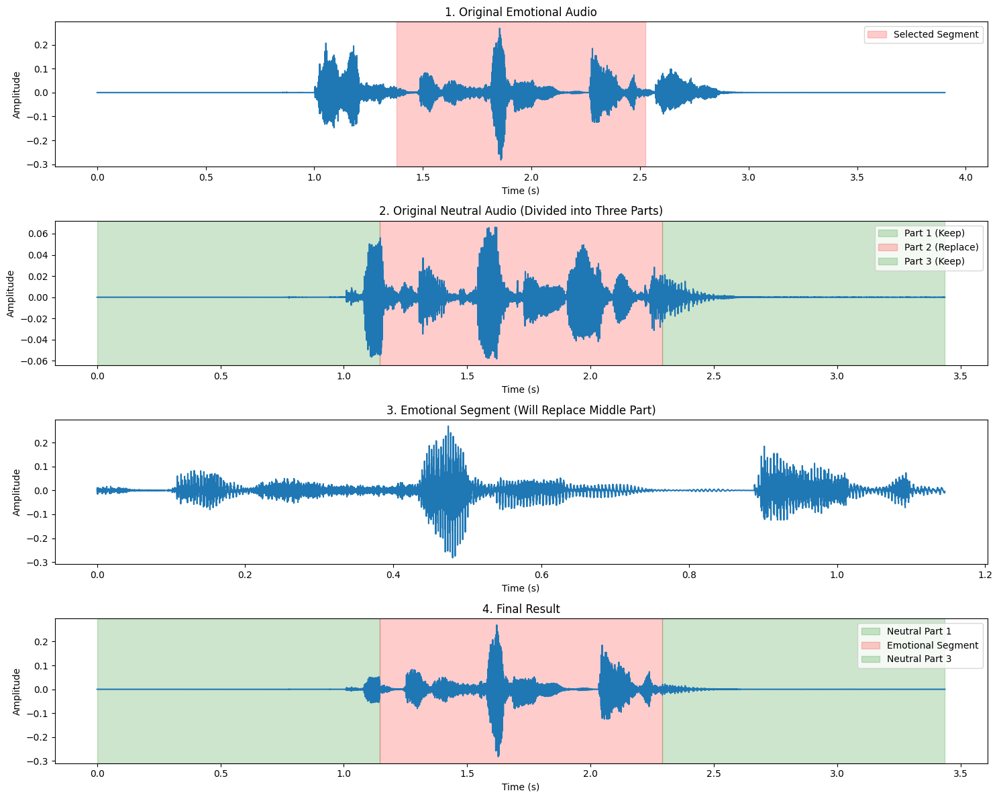


1. Original Emotional Audio:



2. Original Neutral Audio:



3. Parts separately:
   a. First Part (Neutral):


   b. Emotional Segment (Replacing Middle Part):


   c. Last Part (Neutral):



4. Final Result:


In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display
import soundfile as sf
import io

import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def demonstrate_ncp_augmentation_colab(emotional_path: str,
                                     neutral_path: str,
                                     sample_rate: int = 16000):
    """
    Demonstrate the N-CP augmentation process by:
    1. Dividing neutral audio into three equal parts
    2. Replacing the middle part with an emotional segment
    """
    # Load the audio files
    emotional_audio, _ = librosa.load(emotional_path, sr=sample_rate)
    neutral_audio, _ = librosa.load(neutral_path, sr=sample_rate)

    # Calculate the length of each part (we'll divide neutral into three equal parts)
    part_length = len(neutral_audio) // 3

    # Extract the three parts of neutral audio
    neutral_part1 = neutral_audio[0:part_length]
    neutral_part2 = neutral_audio[part_length:2*part_length]  # This will be replaced
    neutral_part3 = neutral_audio[2*part_length:3*part_length]

    # Extract matching length segment from emotional audio
    # Take it from the middle of emotional audio where emotion might be strongest
    emotional_start = (len(emotional_audio) - part_length) // 2
    emotional_segment = emotional_audio[emotional_start:emotional_start + part_length]

    # Create the result by concatenating parts
    result = np.concatenate([
        neutral_part1,      # First part: neutral
        emotional_segment,  # Middle part: emotional
        neutral_part3       # Last part: neutral
    ])

    # Visualize the process
    fig, axes = plt.subplots(4, 1, figsize=(15, 12))

    # Original emotional audio
    time_emotional = np.arange(len(emotional_audio)) / sample_rate
    axes[0].plot(time_emotional, emotional_audio)
    axes[0].set_title('1. Original Emotional Audio')
    axes[0].set_xlabel('Time (s)')
    axes[0].set_ylabel('Amplitude')
    axes[0].axvspan(emotional_start/sample_rate,
                    (emotional_start + part_length)/sample_rate,
                    color='red', alpha=0.2, label='Selected Segment')
    axes[0].legend()

    # Original neutral audio with parts marked
    time_neutral = np.arange(len(neutral_audio)) / sample_rate
    axes[1].plot(time_neutral, neutral_audio)
    axes[1].set_title('2. Original Neutral Audio (Divided into Three Parts)')
    axes[1].set_xlabel('Time (s)')
    axes[1].set_ylabel('Amplitude')

    # Color the three parts
    axes[1].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 1 (Keep)')
    axes[1].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Part 2 (Replace)')
    axes[1].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Part 3 (Keep)')
    axes[1].legend()

    # Selected emotional segment
    time_segment = np.arange(len(emotional_segment)) / sample_rate
    axes[2].plot(time_segment, emotional_segment)
    axes[2].set_title('3. Emotional Segment (Will Replace Middle Part)')
    axes[2].set_xlabel('Time (s)')
    axes[2].set_ylabel('Amplitude')

    # Final augmented audio
    time_result = np.arange(len(result)) / sample_rate
    axes[3].plot(time_result, result)
    axes[3].set_title('4. Final Result')
    axes[3].set_xlabel('Time (s)')
    axes[3].set_ylabel('Amplitude')

    # Color the parts in result
    axes[3].axvspan(0, part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 1')
    axes[3].axvspan(part_length/sample_rate, 2*part_length/sample_rate,
                    color='red', alpha=0.2, label='Emotional Segment')
    axes[3].axvspan(2*part_length/sample_rate, 3*part_length/sample_rate,
                    color='green', alpha=0.2, label='Neutral Part 3')
    axes[3].legend()

    plt.tight_layout()
    plt.show()

    # Play the audio files
    print("\n1. Original Emotional Audio:")
    display(Audio(emotional_audio, rate=sample_rate))

    print("\n2. Original Neutral Audio:")
    display(Audio(neutral_audio, rate=sample_rate))

    print("\n3. Parts separately:")
    print("   a. First Part (Neutral):")
    display(Audio(neutral_part1, rate=sample_rate))
    print("   b. Emotional Segment (Replacing Middle Part):")
    display(Audio(emotional_segment, rate=sample_rate))
    print("   c. Last Part (Neutral):")
    display(Audio(neutral_part3, rate=sample_rate))

    print("\n4. Final Result:")
    display(Audio(result, rate=sample_rate))

    return result

# Get one emotional and one neutral sample
emotional_sample = train_df[train_df['emotion'] == 'angry'].iloc[0]
neutral_sample = train_df[train_df['emotion'] == 'neutral'].iloc[0]

# Run demonstration with audio playback
augmented_audio = demonstrate_ncp_augmentation_colab(
    emotional_path=emotional_sample['path'],
    neutral_path=neutral_sample['path']
)

Final N-CP Method

In [ ]:
import numpy as np
import librosa
import matplotlib.pyplot as plt
from IPython.display import Audio, display

def ncp_augmentation(emotional_audio: np.ndarray,
                         neutral_audio: np.ndarray) -> np.ndarray:
    """
    Apply Neutral-CopyPaste augmentation to create an emotionally augmented utterance.

    Args:
        emotional_audio: Source array containing emotional speech
        neutral_audio: Target array containing neutral speech to be augmented

    Returns:
        Augmented audio array with emotional segment inserted
    """
    # Calculate the length of each part (divide neutral into three equal parts)
    part_length = len(neutral_audio) // 3

    # Extract the three parts of neutral audio
    neutral_part1 = neutral_audio[0:part_length]
    neutral_part3 = neutral_audio[2*part_length:3*part_length]

    # Extract matching length segment from emotional audio
    emotional_start = (len(emotional_audio) - part_length) // 2
    emotional_segment = emotional_audio[emotional_start:emotional_start + part_length]

    # Create the result by concatenating parts
    result = np.concatenate([
        neutral_part1,      # First part: neutral
        emotional_segment,  # Middle part: emotional
        neutral_part3       # Last part: neutral
    ])

    return result

## 4. Creation of All Test Datasets (Augmented)

In [ ]:
def create_augmented_df_sample(df: pd.DataFrame, aug_type: str, split: str, SEED: int = 42) -> pd.DataFrame:
    """
    Creates augmented version of dataset using specified augmentation with sampled parameters

    Args:
        df: Original dataframe with [gender, emotion, labels, source, path]
        aug_type: One of ['time_stretch', 'add_noise', 'spec_augment']
        split: Either 'train' or 'test' to separate storage

    Returns:
        DataFrame with augmented samples (1:1 with original)
    """
    # Create directory if it doesn't exist
    np.random.seed(SEED)
    save_dir = f"augmented/{split}/{aug_type}"
    os.makedirs(save_dir, exist_ok=True)

    augmented_rows = []

    for idx, row in df.iterrows():
        # Load audio
        audio, sr = librosa.load(row['path'], sr=16000)

        # Sample parameters based on augmentation type
        if aug_type == 'time_stretch':
            param = np.random.choice(param_values["time_stretch"])
            aug_audio = time_stretch(audio, rate=param)
            param_str = f"rate{param}"

        elif aug_type == 'add_noise':
            param = np.random.choice(param_values["add_noise"])
            aug_audio = add_noise(audio, noise_level=param)
            param_str = f"noise{param}"

        elif aug_type == 'spec_augment':
            time_mask = np.random.choice(param_values["spec_augment"]["time_mask_param"])
            freq_mask = np.random.choice(param_values["spec_augment"]["freq_mask_param"])
            aug_audio = spec_augment(audio, sr, time_mask_param=time_mask, freq_mask_param=freq_mask)
            param = {'time_mask': time_mask, 'freq_mask': freq_mask}
            param_str = f"time{time_mask}_freq{freq_mask}"

        # Save augmented audio
        aug_path = os.path.join(save_dir, f"{idx}_{param_str}_{row['emotion']}.wav")
        sf.write(aug_path, aug_audio, sr)

        # Create new row
        new_row = {
            'gender': row['gender'],
            'emotion': row['emotion'],
            'labels': row['labels'],
            'source': row['source'],
            'path': aug_path,
            'aug_type': aug_type,
            'aug_params': param
        }
        augmented_rows.append(new_row)

    return pd.DataFrame(augmented_rows)

In [ ]:
# clean test set
test_df['aug_type'] = 'clean'
test_df['aug_params'] = None
# augmented test set
test_time_stretched_df = create_augmented_df_sample(test_df, 'time_stretch', 'test')
test_noisy_df = create_augmented_df_sample(test_df, 'add_noise', 'test')
test_spec_df = create_augmented_df_sample(test_df, 'spec_augment', 'test')
# combined test set
test_combined_time_stretch = pd.concat([test_df, test_time_stretched_df], ignore_index=True)
test_combined_noise = pd.concat([test_df, test_noisy_df], ignore_index=True)
test_combined_spec = pd.concat([test_df, test_spec_df], ignore_index=True)

<ipython-input-32-0d09855cc2fb>:9: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_combined_time_stretch = pd.concat([test_df, test_time_stretched_df], ignore_index=True)
<ipython-input-32-0d09855cc2fb>:10: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  test_combined_noise = pd.concat([test_df, test_noisy_df], ignore_index=True)


In [ ]:
test_sets = {
    'Clean': test_df,
    'Time Stretched': test_time_stretched_df,
    'Noise': test_noisy_df,
    'SpecAugment': test_spec_df,
    'Combined Time Stretch': test_combined_time_stretch,
    'Combined Noise': test_combined_noise,
    'Combined SpecAugment': test_combined_spec
}

**Saving the test sets including the audio files**

In [ ]:
import os
import shutil
import pandas as pd
import pickle

def save_test_sets_with_audio(test_sets, base_save_dir='test_sets_backup'):
    """
    Saves test sets and their audio files in an organized folder structure

    Args:
        test_sets: Your dictionary containing all test DataFrames (clean, noise, etc.)
        base_save_dir: The main folder where everything will be saved
    """
    # Create the main folder if it doesn't exist
    os.makedirs(base_save_dir, exist_ok=True)

    # Go through each test set (clean, noise, etc.)
    for set_name, df in test_sets.items():
        # Create a folder for this specific test set
        set_folder = os.path.join(base_save_dir, set_name.replace(' ', '_'))
        os.makedirs(set_folder, exist_ok=True)

        # Create an audio folder inside the test set folder
        audio_folder = os.path.join(set_folder, 'audio')
        os.makedirs(audio_folder, exist_ok=True)

        # Make a copy of the DataFrame to update paths
        new_df = df.copy()

        # Go through each row in the DataFrame
        for idx, row in df.iterrows():
            # Get the audio file name from the original path
            audio_file = os.path.basename(row['path'])

            # Copy the audio file to our new audio folder
            shutil.copy2(row['path'], os.path.join(audio_folder, audio_file))

            # Update the path in the DataFrame to point to the new location
            new_df.at[idx, 'path'] = os.path.join(audio_folder, audio_file)

        # Save the updated DataFrame
        new_df.to_pickle(os.path.join(set_folder, 'metadata.pkl'))

In [ ]:
# Saving in Google Drive (if mounted):
save_test_sets_with_audio(test_sets, base_save_dir= f"{BASE_DIR}/Datasets/RAVDNESS/test_sets")

Loaing the test sets

In [ ]:
def load_test_sets(base_dir='test_sets_backup'):
    """
    Loads all saved test sets and restores original naming with spaces
    """
    loaded_sets = {}

    # Go through each folder in the base directory
    for set_folder in os.listdir(base_dir):
        if os.path.isdir(os.path.join(base_dir, set_folder)):
            # Load the DataFrame
            df_path = os.path.join(base_dir, set_folder, 'metadata.pkl')
            if os.path.exists(df_path):
                # Convert folder name back to original format (replace underscores with spaces)
                original_name = set_folder.replace('_', ' ')
                loaded_sets[original_name] = pd.read_pickle(df_path)

    return loaded_sets

Check for correctness in the proceadure

In [ ]:
# First, let's load the saved test sets
loaded_test_sets = load_test_sets(base_dir= f"{BASE_DIR}/Datasets/RAVDNESS/test_sets")

# Let's do some checks:

# 1. Check if we have all the same keys (test set names)
print("Original test set names:", test_sets.keys())
print("Loaded test set names:", loaded_test_sets.keys())

# 2. Check if the DataFrames have the same shape
for set_name in test_sets.keys():
    original_shape = test_sets[set_name].shape
    loaded_shape = loaded_test_sets[set_name].shape
    print(f"\n{set_name}:")
    print(f"Original shape: {original_shape}")
    print(f"Loaded shape: {loaded_shape}")

# 3. Check if we have the same emotions and labels
for set_name in test_sets.keys():
    original_emotions = test_sets[set_name]['emotion'].value_counts()
    loaded_emotions = loaded_test_sets[set_name]['emotion'].value_counts()

    print(f"\n{set_name} emotion distribution:")
    print("Original:")
    print(original_emotions)
    print("\nLoaded:")
    print(loaded_emotions)

# 4. Verify a few audio paths exist
for set_name in test_sets.keys():
    sample_path = loaded_test_sets[set_name]['path'].iloc[0]
    print(f"\n{set_name} first audio file exists:", os.path.exists(sample_path))

Original test set names: dict_keys(['Clean', 'Time Stretched', 'Noise', 'SpecAugment', 'Combined Time Stretch', 'Combined Noise', 'Combined SpecAugment'])
Loaded test set names: dict_keys(['Clean', 'Time Stretched', 'Noise', 'SpecAugment', 'Combined Time Stretch', 'Combined Noise', 'Combined SpecAugment'])

Clean:
Original shape: (250, 7)
Loaded shape: (250, 7)

Time Stretched:
Original shape: (250, 7)
Loaded shape: (250, 7)

Noise:
Original shape: (250, 7)
Loaded shape: (250, 7)

SpecAugment:
Original shape: (250, 7)
Loaded shape: (250, 7)

Combined Time Stretch:
Original shape: (500, 7)
Loaded shape: (500, 7)

Combined Noise:
Original shape: (500, 7)
Loaded shape: (500, 7)

Combined SpecAugment:
Original shape: (500, 7)
Loaded shape: (500, 7)

Clean emotion distribution:
Original:
emotion
fear        39
happy       39
sad         39
surprise    38
disgust     38
angry       38
neutral     19
Name: count, dtype: int64

Loaded:
emotion
fear        39
happy       39
sad         39
surpr

## 5. Baseling Performance Analysis on Augmented Testsets

**Preprocessing to HuBERT**

In [7]:
def map_to_array(example):
   speech, _ = librosa.load(example["path"], sr=16000, mono=True)
   example["speech"] = speech
   return example

class EmotionDataset(torch.utils.data.Dataset):
   def __init__(self, encodings, labels):
       self.encodings = encodings
       pattern = {
           1: 0,  # neutral
           2: 0,  # neutral
           3: 1,  # happy
           4: 2,  # sad
           5: 3,  # angry
           6: 4,  # fear
           7: 5,  # disgust
           8: 6   # surprise
       }
       self.labels = [pattern[x] for x in labels]

   def __getitem__(self, idx):
       item = {key: val[idx] for key, val in self.encodings.items()}
       item['labels'] = torch.tensor(self.labels[idx])
       return item

   def __len__(self):
       return len(self.labels)

# Prediction function
def predict(outputs):
   probabilities = torch.softmax(outputs["logits"], dim=1)
   predictions = torch.argmax(probabilities, dim=1)
   return predictions

**Function to test a single test set**

In [ ]:
def evaluate_test_set(model, model_name, test_df, set_name, device, feature_extractor):
    """
    Evaluates model performance on a given test set and generates analysis

    Args:
        model: The trained model
        test_df: DataFrame containing test data
        set_name: String identifying the test set (e.g., 'Noise', 'Time Stretch')
        emotions: List of emotion labels
        device: torch device
        feature_extractor: HuBERT feature extractor
    """
    # Ensure model is in eval mode and gradients are disabled
    model.eval()
    for param in model.parameters():
        param.requires_grad = False

    # Prepare data
    test_data = Dataset.from_pandas(test_df).map(map_to_array)
    test_encodings = feature_extractor(
        list(test_data["speech"]),
        sampling_rate=16000,
        padding=True,
        return_tensors="pt"
    )
    test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    # Testing loop
    with torch.no_grad():
        correct = 0
        count = 0
        record = {"labels": [], "predictions": []}

        pbar = tqdm(test_loader, desc=f"Testing {set_name}")
        for batch in pbar:
            input_ids = batch['input_values'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)

            predictions = predict(outputs)
            correct += predictions.eq(labels).sum().item()
            count += len(labels)
            accuracy = correct / count

            pbar.set_postfix({
                'loss': f'{outputs["loss"].item():.3f}',
                'accuracy': f'{accuracy:.3f}'
            })

            record["labels"] += labels.cpu().numpy().tolist()
            record["predictions"] += predictions.cpu().numpy().tolist()

        pbar.close()

    # Analysis
    df_record = pd.DataFrame(record)
    df_record.columns = ["Ground Truth", "Model Prediction"]
    emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
    df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
    df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

    # Results printing
    print(f"\n=== Results for {set_name} ===")
    print(f"Final accuracy: {accuracy*100:.4f}%")

    # Classification report
    print(f"\nClassification Report for {model_name} model on {set_name} test set:")
    report = classification_report(
        df_record["Ground Truth"],
        df_record["Model Prediction"]
    )
    print(report)

    # Confusion Matrix
    plt.figure(figsize=(10, 8))
    crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
    sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
    plt.title(f"Confusion Matrix for {model_name} model - {set_name} test set\n(Accuracy: {accuracy*100:.2f}%)", fontweight='bold')
    plt.ylabel("True Labels", fontweight='bold')
    plt.xlabel("Predicted Labels", fontweight='bold')
    plt.show()

    return accuracy, df_record

**Evaluating results for baseline model on all test sets**


Evaluating Baseline model on Combined Noise dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined Noise: 100%|██████████| 500/500 [00:46<00:00, 10.76it/s, loss=0.394, accuracy=0.628]



=== Results for Combined Noise ===
Final accuracy: 62.8000%

Classification Report for Baseline model on Combined Noise test set:
              precision    recall  f1-score   support

       angry       0.92      0.76      0.83        76
     disgust       1.00      0.43      0.61        76
        fear       0.80      0.55      0.65        78
       happy       0.38      0.83      0.52        78
     neutral       0.51      0.76      0.61        38
         sad       0.63      0.60      0.61        78
    surprise       0.85      0.51      0.64        76

    accuracy                           0.63       500
   macro avg       0.73      0.64      0.64       500
weighted avg       0.74      0.63      0.64       500



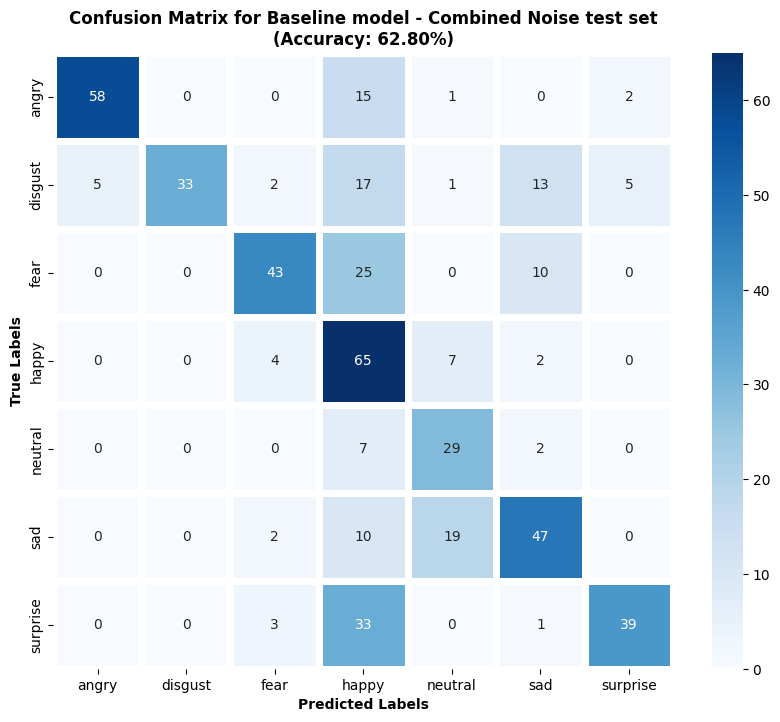


Evaluating Baseline model on Time Stretched dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Time Stretched: 100%|██████████| 250/250 [00:26<00:00,  9.33it/s, loss=0.438, accuracy=0.528]



=== Results for Time Stretched ===
Final accuracy: 52.8000%

Classification Report for Baseline model on Time Stretched test set:
              precision    recall  f1-score   support

       angry       0.79      0.61      0.69        38
     disgust       1.00      0.37      0.54        38
        fear       0.71      0.56      0.63        39
       happy       0.29      0.90      0.44        39
     neutral       0.40      0.32      0.35        19
         sad       0.68      0.38      0.49        39
    surprise       0.89      0.45      0.60        38

    accuracy                           0.53       250
   macro avg       0.68      0.51      0.53       250
weighted avg       0.70      0.53      0.55       250



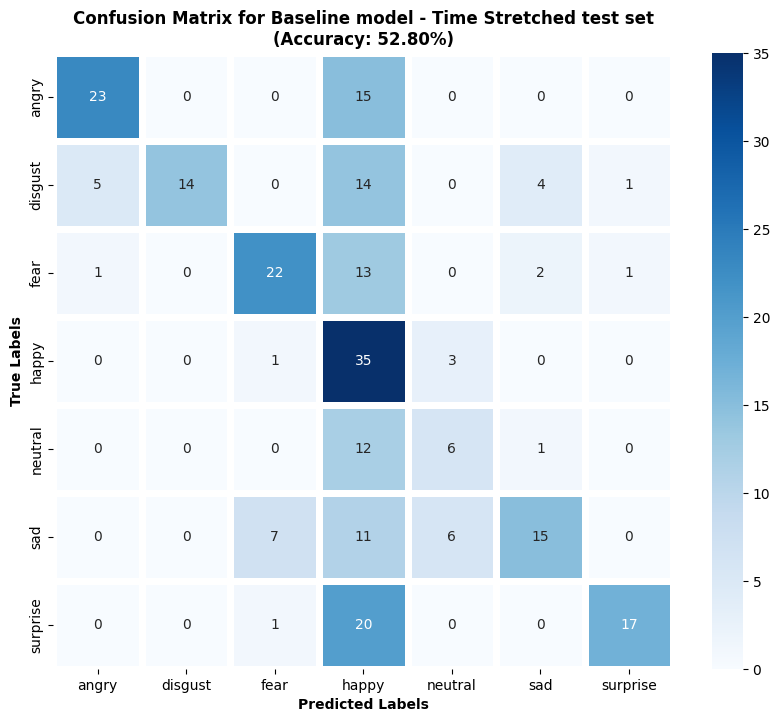


Evaluating Baseline model on SpecAugment dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing SpecAugment: 100%|██████████| 250/250 [00:22<00:00, 10.87it/s, loss=0.431, accuracy=0.712]



=== Results for SpecAugment ===
Final accuracy: 71.2000%

Classification Report for Baseline model on SpecAugment test set:
              precision    recall  f1-score   support

       angry       0.89      0.87      0.88        38
     disgust       1.00      0.55      0.71        38
        fear       0.83      0.77      0.80        39
       happy       0.52      0.79      0.63        39
     neutral       0.45      0.95      0.61        19
         sad       0.82      0.46      0.59        39
    surprise       0.79      0.71      0.75        38

    accuracy                           0.71       250
   macro avg       0.76      0.73      0.71       250
weighted avg       0.78      0.71      0.72       250



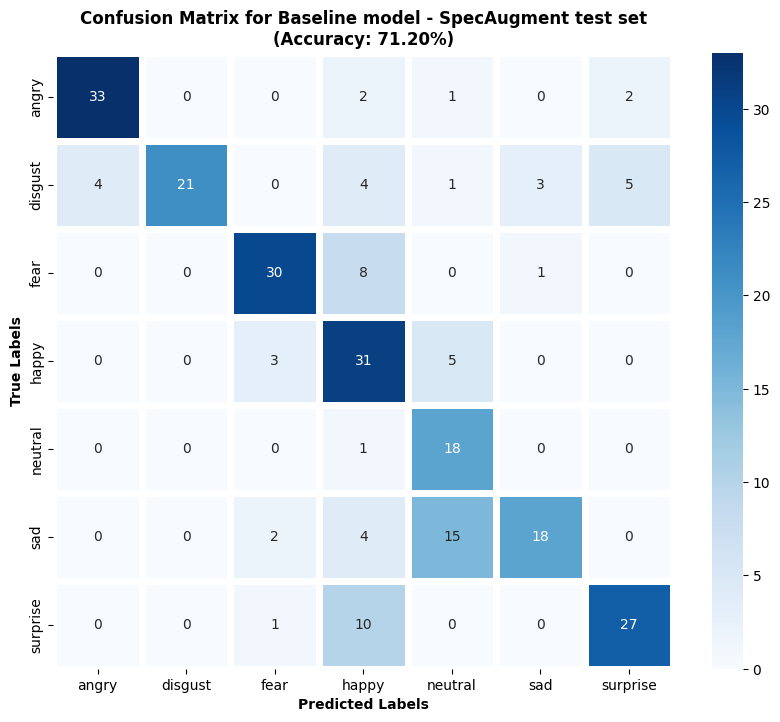


Evaluating Baseline model on Combined Time Stretch dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined Time Stretch: 100%|██████████| 500/500 [00:54<00:00,  9.18it/s, loss=0.438, accuracy=0.634]



=== Results for Combined Time Stretch ===
Final accuracy: 63.4000%

Classification Report for Baseline model on Combined Time Stretch test set:
              precision    recall  f1-score   support

       angry       0.86      0.75      0.80        76
     disgust       1.00      0.50      0.67        76
        fear       0.78      0.68      0.73        78
       happy       0.38      0.85      0.52        78
     neutral       0.44      0.63      0.52        38
         sad       0.77      0.44      0.56        78
    surprise       0.85      0.59      0.70        76

    accuracy                           0.63       500
   macro avg       0.73      0.63      0.64       500
weighted avg       0.75      0.63      0.65       500



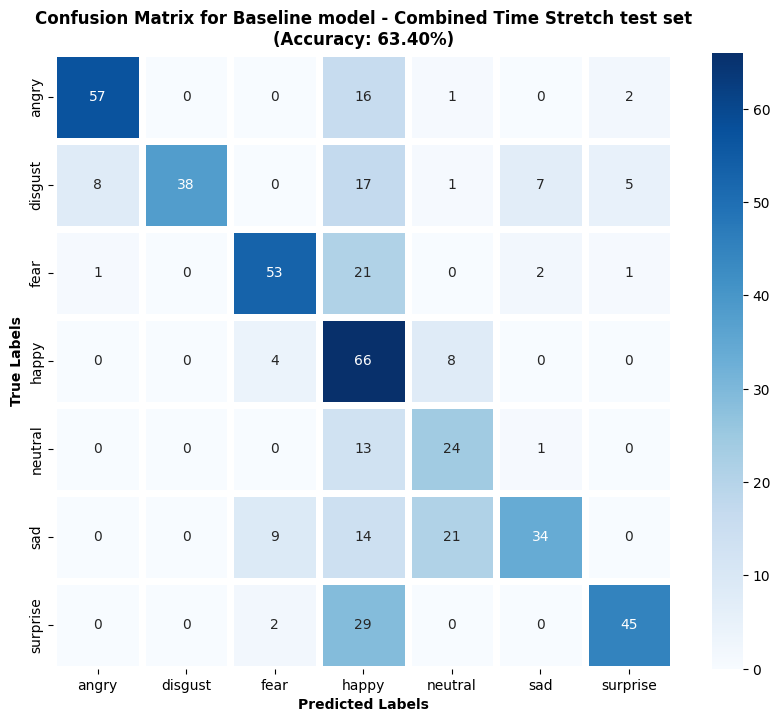


Evaluating Baseline model on Combined SpecAugment dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined SpecAugment: 100%|██████████| 500/500 [00:46<00:00, 10.74it/s, loss=0.431, accuracy=0.726]



=== Results for Combined SpecAugment ===
Final accuracy: 72.6000%

Classification Report for Baseline model on Combined SpecAugment test set:
              precision    recall  f1-score   support

       angry       0.91      0.88      0.89        76
     disgust       1.00      0.59      0.74        76
        fear       0.84      0.78      0.81        78
       happy       0.53      0.79      0.64        78
     neutral       0.45      0.95      0.61        38
         sad       0.84      0.47      0.61        78
    surprise       0.81      0.72      0.76        76

    accuracy                           0.73       500
   macro avg       0.77      0.74      0.72       500
weighted avg       0.79      0.73      0.73       500



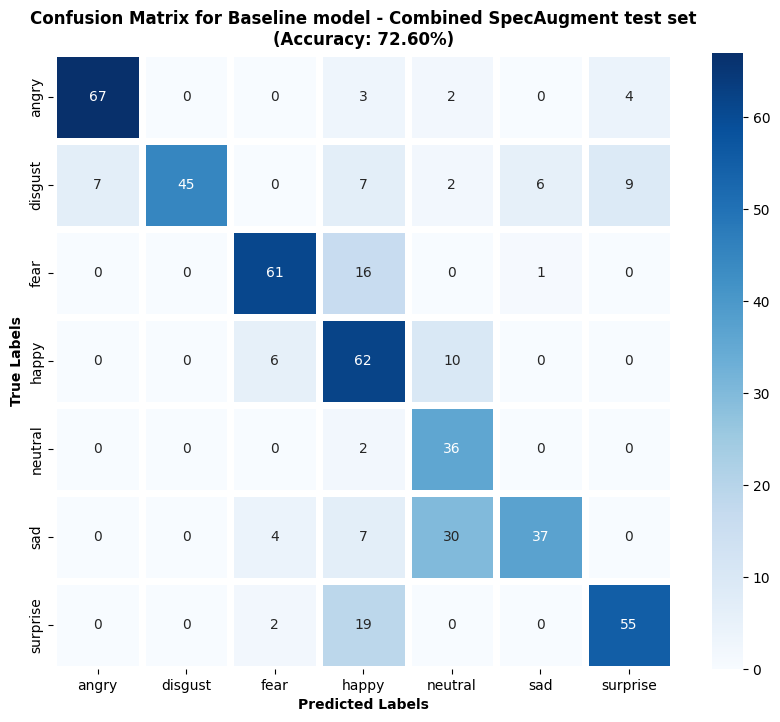


Evaluating Baseline model on Noise dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Noise: 100%|██████████| 250/250 [00:22<00:00, 11.23it/s, loss=0.394, accuracy=0.516]



=== Results for Noise ===
Final accuracy: 51.6000%

Classification Report for Baseline model on Noise test set:
              precision    recall  f1-score   support

       angry       0.92      0.63      0.75        38
     disgust       1.00      0.24      0.38        38
        fear       0.71      0.31      0.43        39
       happy       0.29      0.87      0.44        39
     neutral       0.65      0.58      0.61        19
         sad       0.53      0.72      0.61        39
    surprise       0.92      0.29      0.44        38

    accuracy                           0.52       250
   macro avg       0.72      0.52      0.52       250
weighted avg       0.72      0.52      0.52       250



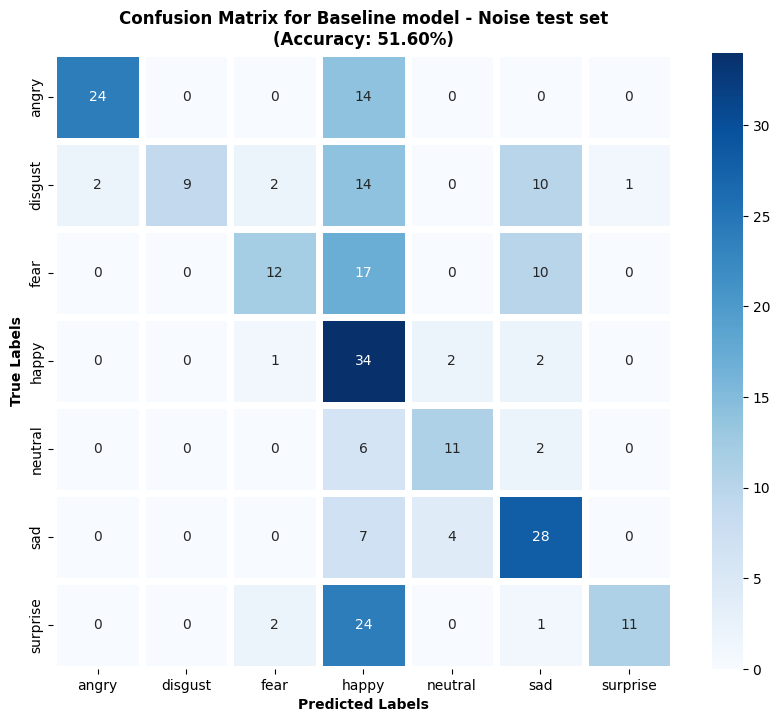


Evaluating Baseline model on NCP dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing NCP: 100%|██████████| 250/250 [00:15<00:00, 16.27it/s, loss=0.092, accuracy=0.396]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} 


=== Results for NCP ===
Final accuracy: 39.6000%

Classification Report for Baseline model on NCP test set:
              precision    recall  f1-score   support

       angry       0.66      0.61      0.63        41
     disgust       1.00      0.27      0.42        41
        fear       0.33      0.07      0.12        43
       happy       0.24      0.83      0.38        42
     neutral       0.00      0.00      0.00         0
         sad       0.83      0.12      0.21        42
    surprise       0.74      0.49      0.59        41

    accuracy                           0.40       250
   macro avg       0.54      0.34      0.33       250
weighted avg       0.63      0.40      0.39       250



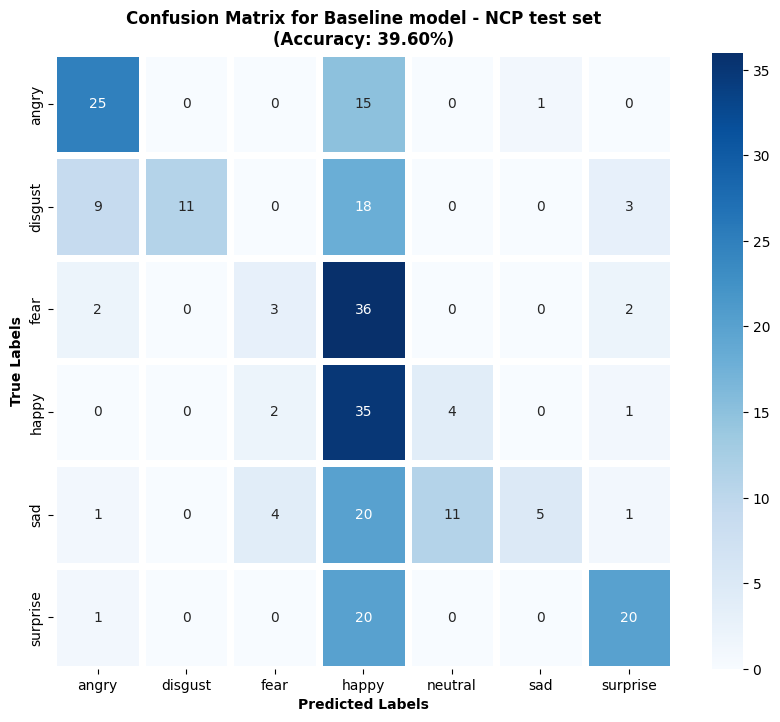


Evaluating Baseline model on Combined NCP dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined NCP: 100%|██████████| 500/500 [00:46<00:00, 10.86it/s, loss=0.092, accuracy=0.592]



=== Results for Combined NCP ===
Final accuracy: 59.2000%

Classification Report for Baseline model on Combined NCP test set:
              precision    recall  f1-score   support

       angry       0.77      0.73      0.75        79
     disgust       1.00      0.51      0.67        79
        fear       0.77      0.44      0.56        82
       happy       0.34      0.84      0.48        81
     neutral       0.38      0.95      0.54        19
         sad       0.93      0.33      0.49        81
    surprise       0.82      0.62      0.71        79

    accuracy                           0.59       500
   macro avg       0.71      0.63      0.60       500
weighted avg       0.75      0.59      0.61       500



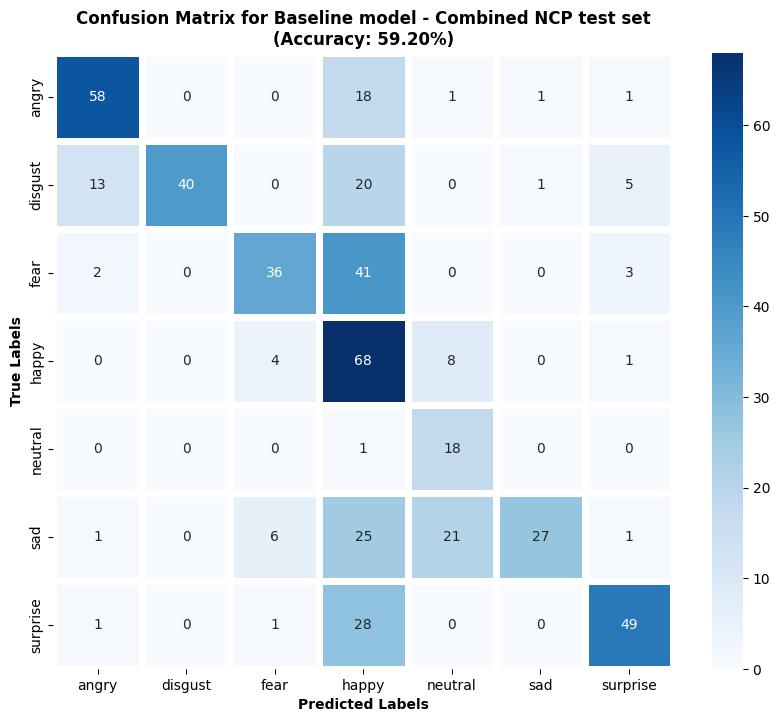


Evaluating Baseline model on Clean dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Clean: 100%|██████████| 250/250 [00:22<00:00, 11.12it/s, loss=0.389, accuracy=0.740]



=== Results for Clean ===
Final accuracy: 74.0000%

Classification Report for Baseline model on Clean test set:
              precision    recall  f1-score   support

       angry       0.92      0.89      0.91        38
     disgust       1.00      0.63      0.77        38
        fear       0.84      0.79      0.82        39
       happy       0.55      0.79      0.65        39
     neutral       0.45      0.95      0.61        19
         sad       0.86      0.49      0.62        39
    surprise       0.82      0.74      0.78        38

    accuracy                           0.74       250
   macro avg       0.78      0.76      0.74       250
weighted avg       0.80      0.74      0.75       250



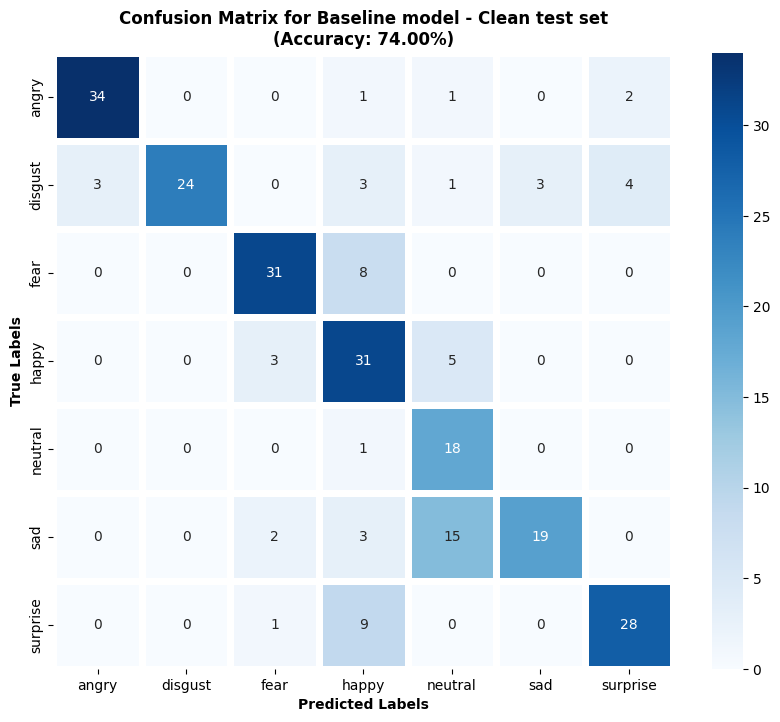

In [11]:
# Store results for comparison
results = {}
model_name = "Baseline"

# Evaluate on test sets
for set_name, test_data in test_sets.items():
  print(f"\nEvaluating {model_name} model on {set_name} dataset...")
  accuracy, df_record = evaluate_test_set(
          model,
          model_name,
          test_data,
          set_name,
          device,
          feature_extractor
  )
  results[set_name] = {'accuracy': accuracy, 'record': df_record}

**Results comparation**


=== Accuracy Comparison ===
                       Accuracy
Combined Noise            0.628
Time Stretched            0.528
SpecAugment               0.712
Combined Time Stretch     0.634
Combined SpecAugment      0.726
Noise                     0.516
NCP                       0.396
Combined NCP              0.592
Clean                     0.740


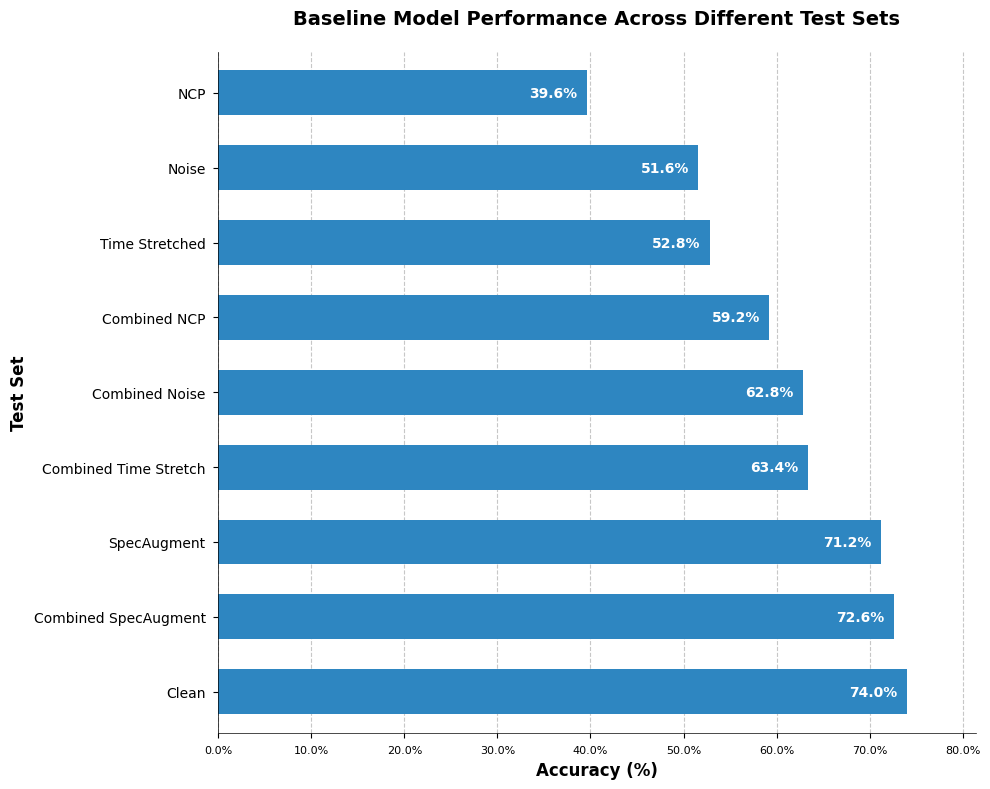

In [12]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Compare results
accuracies = {name: data['accuracy'] for name, data in results.items()}
comparison_df = pd.DataFrame.from_dict(accuracies, orient='index', columns=['Accuracy'])
print("\n=== Accuracy Comparison ===")
print(comparison_df)

# Sort the DataFrame by accuracy in descending order
comparison_df_sorted = comparison_df.sort_values('Accuracy', ascending=False)

# Set the style for a clean, professional look
plt.style.use('seaborn-v0_8-paper')

# Create the figure
fig, ax = plt.subplots(figsize=(10, 8))

# Create horizontal bar plot with sorted data
bars = comparison_df_sorted.plot(
    kind='barh',
    ax=ax,
    width=0.6,
    color='#2E86C1',
    legend=False
)

# Customize the plot appearance
plt.title('Baseline Model Performance Across Different Test Sets',
          fontsize=14,
          fontweight='bold',
          pad=20)

plt.xlabel('Accuracy (%)',
          fontsize=12,
          fontweight='bold')
plt.ylabel('Test Set',
          fontsize=12,
          fontweight='bold')

# Format y-axis labels
ax.set_yticklabels(comparison_df_sorted.index,
                   fontsize=10)

# Add value labels inside the bars
for i, v in enumerate(comparison_df_sorted['Accuracy']):
    percentage = f'{v:.1%}'
    ax.text(v - 0.01,
            i,
            percentage,
            ha='right',
            va='center',
            fontsize=10,
            fontweight='bold',
            color='white')

# Customize grid
ax.grid(axis='x', linestyle='--', alpha=0.7)
ax.set_axisbelow(True)

# Set x-axis limits and format
ax.set_xlim(0, max(comparison_df_sorted['Accuracy']) * 1.1)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f'{x:.1%}'))

# Remove top and right spines
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# Make remaining spines thinner
ax.spines['left'].set_linewidth(0.5)
ax.spines['bottom'].set_linewidth(0.5)

# Adjust layout
plt.tight_layout()

# Save the figure
plt.savefig('accuracy_comparison_sorted.pdf',
            dpi=300,
            bbox_inches='tight',
            format='pdf')
plt.savefig('accuracy_comparison_sorted.png',
            dpi=300,
            bbox_inches='tight',
            format='png')

plt.show()

## 5b. Load the model and evaluate
Shortcut to evluation of Baseline's performance on all testsets - loading the model and test on all sets.


In [ ]:
def map_to_array(example):
   speech, _ = librosa.load(example["path"], sr=16000, mono=True)
   example["speech"] = speech
   return example

class EmotionDataset(torch.utils.data.Dataset):
   def __init__(self, encodings, labels):
       self.encodings = encodings
       pattern = {
           1: 0,  # neutral
           2: 0,  # neutral
           3: 1,  # happy
           4: 2,  # sad
           5: 3,  # angry
           6: 4,  # fear
           7: 5,  # disgust
           8: 6   # surprise
       }
       self.labels = [pattern[x] for x in labels]

   def __getitem__(self, idx):
       item = {key: val[idx] for key, val in self.encodings.items()}
       item['labels'] = torch.tensor(self.labels[idx])
       return item

   def __len__(self):
       return len(self.labels)

# Prediction function
def predict(outputs):
   probabilities = torch.softmax(outputs["logits"], dim=1)
   predictions = torch.argmax(probabilities, dim=1)
   return predictions

In [8]:
def load_test_sets(base_dir='test_sets_backup'):
    """
    Loads all saved test sets and restores original naming with spaces.
    """
    loaded_sets = {}

    # Go through each folder in the base directory
    for set_folder in os.listdir(base_dir):
        if os.path.isdir(os.path.join(base_dir, set_folder)):
            # Load the DataFrame
            df_path = os.path.join(base_dir, set_folder, 'metadata.pkl')
            if os.path.exists(df_path):
                # Convert folder name back to original format (replace underscores with spaces)
                original_name = set_folder.replace('_', ' ')
                loaded_sets[original_name] = pd.read_pickle(df_path)

    return loaded_sets
test_sets_path = f"{BASE_DIR}/Datasets/RAVDNESS"
loaded_test_sets = load_test_sets(test_sets_path)

In [9]:
def evaluate_test_set(model, model_name, test_df, set_name, device, feature_extractor):
    """
    Evaluates model performance on a given test set and generates analysis

    Args:
        model: The trained model
        test_df: DataFrame containing test data
        set_name: String identifying the test set (e.g., 'Noise', 'Time Stretch')
        emotions: List of emotion labels
        device: torch device
        feature_extractor: HuBERT feature extractor
    """
    # Ensure model is in eval mode and gradients are disabled
    model.eval()
    for param in model.parameters():
        param.requires_grad = False

    # Prepare data
    test_data = Dataset.from_pandas(test_df).map(map_to_array)
    test_encodings = feature_extractor(
        list(test_data["speech"]),
        sampling_rate=16000,
        padding=True,
        return_tensors="pt"
    )
    test_dataset = EmotionDataset(test_encodings, list(test_data["labels"]))
    test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

    # Testing loop
    with torch.no_grad():
        correct = 0
        count = 0
        record = {"labels": [], "predictions": []}

        pbar = tqdm(test_loader, desc=f"Testing {set_name}")
        for batch in pbar:
            input_ids = batch['input_values'].to(device)
            attention_mask = batch['attention_mask'].to(device)
            labels = batch['labels'].to(device)
            outputs = model(input_ids, attention_mask=attention_mask, labels=labels)

            predictions = predict(outputs)
            correct += predictions.eq(labels).sum().item()
            count += len(labels)
            accuracy = correct / count

            pbar.set_postfix({
                'loss': f'{outputs["loss"].item():.3f}',
                'accuracy': f'{accuracy:.3f}'
            })

            record["labels"] += labels.cpu().numpy().tolist()
            record["predictions"] += predictions.cpu().numpy().tolist()

        pbar.close()

    # Analysis
    df_record = pd.DataFrame(record)
    df_record.columns = ["Ground Truth", "Model Prediction"]
    emotions = ["neutral", "happy", "sad", "angry", "fear", "disgust", "surprise"]
    df_record["Ground Truth"] = df_record["Ground Truth"].apply(lambda x: emotions[x])
    df_record["Model Prediction"] = df_record["Model Prediction"].apply(lambda x: emotions[x])

    # Results printing
    print(f"\n=== Results for {set_name} ===")
    print(f"Final accuracy: {accuracy*100:.4f}%")

    # Classification report
    print(f"\nClassification Report for {model_name} model on {set_name} test set:")
    report = classification_report(
        df_record["Ground Truth"],
        df_record["Model Prediction"]
    )
    print(report)

    # Confusion Matrix
    plt.figure(figsize=(10, 8))
    crosstab = pd.crosstab(df_record["Ground Truth"], df_record["Model Prediction"])
    sns.heatmap(crosstab, cmap='Blues', annot=True, fmt='g', linewidths=5)
    plt.title(f"Confusion Matrix for {model_name} model - {set_name} test set\n(Accuracy: {accuracy*100:.2f}%)", fontweight='bold')
    plt.ylabel("True Labels", fontweight='bold')
    plt.xlabel("Predicted Labels", fontweight='bold')
    plt.show()

    return accuracy, df_record


Evaluating Baseline model on Combined Noise dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined Noise: 100%|██████████| 500/500 [00:43<00:00, 11.57it/s, loss=0.394, accuracy=0.628]



=== Results for Combined Noise ===
Final accuracy: 62.8000%

Classification Report for Baseline model on Combined Noise test set:
              precision    recall  f1-score   support

       angry       0.92      0.76      0.83        76
     disgust       1.00      0.43      0.61        76
        fear       0.80      0.55      0.65        78
       happy       0.38      0.83      0.52        78
     neutral       0.51      0.76      0.61        38
         sad       0.63      0.60      0.61        78
    surprise       0.85      0.51      0.64        76

    accuracy                           0.63       500
   macro avg       0.73      0.64      0.64       500
weighted avg       0.74      0.63      0.64       500



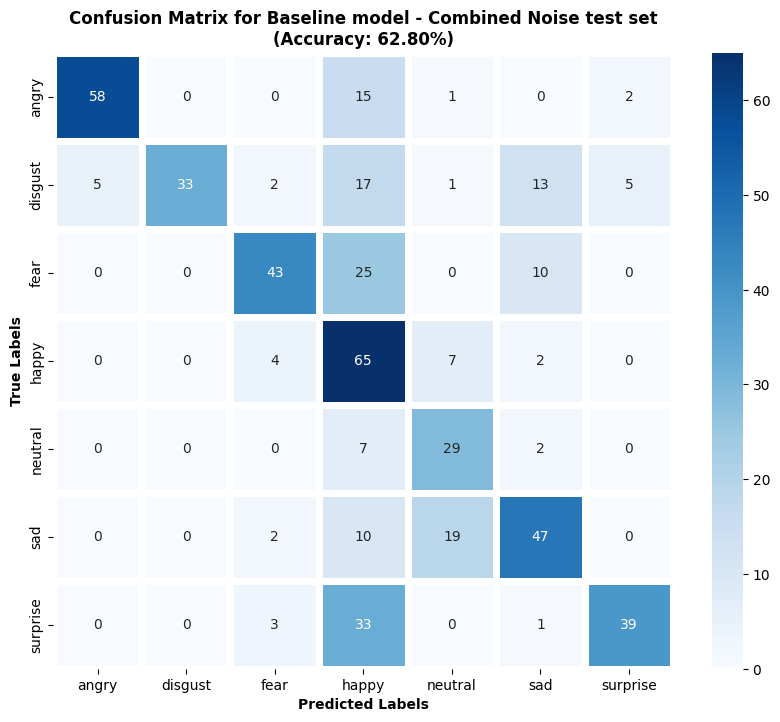


Evaluating Baseline model on Time Stretched dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Time Stretched: 100%|██████████| 250/250 [00:25<00:00,  9.78it/s, loss=0.438, accuracy=0.528]



=== Results for Time Stretched ===
Final accuracy: 52.8000%

Classification Report for Baseline model on Time Stretched test set:
              precision    recall  f1-score   support

       angry       0.79      0.61      0.69        38
     disgust       1.00      0.37      0.54        38
        fear       0.71      0.56      0.63        39
       happy       0.29      0.90      0.44        39
     neutral       0.40      0.32      0.35        19
         sad       0.68      0.38      0.49        39
    surprise       0.89      0.45      0.60        38

    accuracy                           0.53       250
   macro avg       0.68      0.51      0.53       250
weighted avg       0.70      0.53      0.55       250



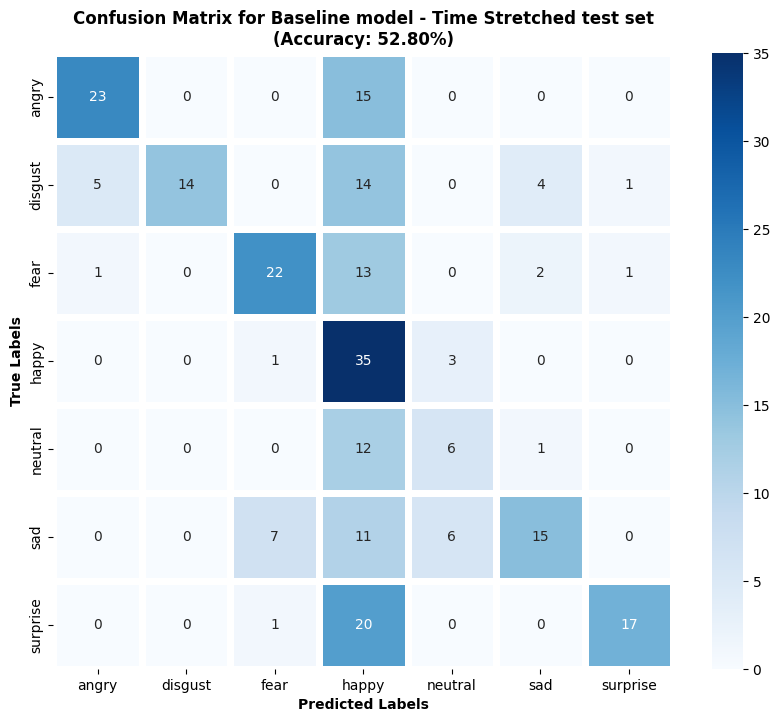


Evaluating Baseline model on SpecAugment dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing SpecAugment: 100%|██████████| 250/250 [00:21<00:00, 11.86it/s, loss=0.431, accuracy=0.712]



=== Results for SpecAugment ===
Final accuracy: 71.2000%

Classification Report for Baseline model on SpecAugment test set:
              precision    recall  f1-score   support

       angry       0.89      0.87      0.88        38
     disgust       1.00      0.55      0.71        38
        fear       0.83      0.77      0.80        39
       happy       0.52      0.79      0.63        39
     neutral       0.45      0.95      0.61        19
         sad       0.82      0.46      0.59        39
    surprise       0.79      0.71      0.75        38

    accuracy                           0.71       250
   macro avg       0.76      0.73      0.71       250
weighted avg       0.78      0.71      0.72       250



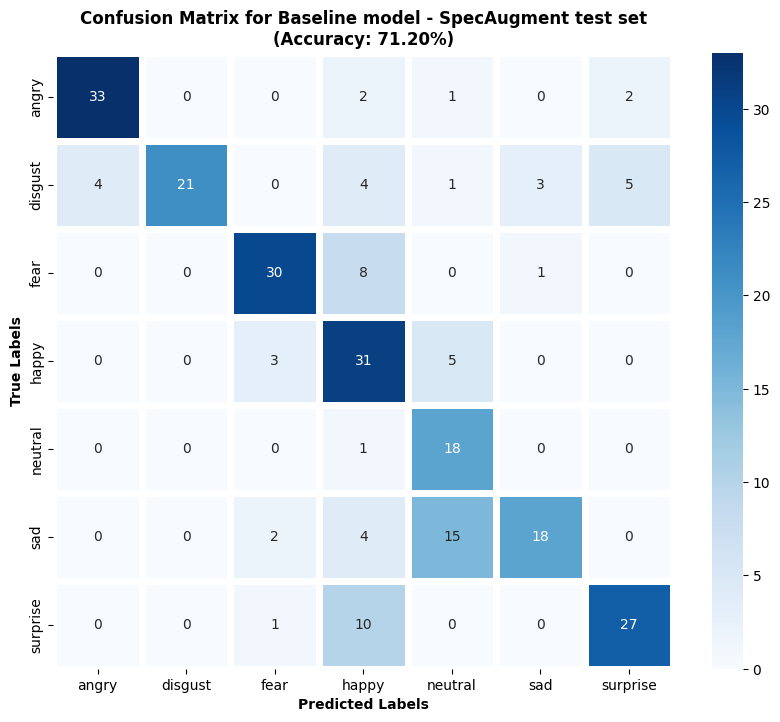


Evaluating Baseline model on Combined Time Stretch dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined Time Stretch: 100%|██████████| 500/500 [00:51<00:00,  9.75it/s, loss=0.438, accuracy=0.634]



=== Results for Combined Time Stretch ===
Final accuracy: 63.4000%

Classification Report for Baseline model on Combined Time Stretch test set:
              precision    recall  f1-score   support

       angry       0.86      0.75      0.80        76
     disgust       1.00      0.50      0.67        76
        fear       0.78      0.68      0.73        78
       happy       0.38      0.85      0.52        78
     neutral       0.44      0.63      0.52        38
         sad       0.77      0.44      0.56        78
    surprise       0.85      0.59      0.70        76

    accuracy                           0.63       500
   macro avg       0.73      0.63      0.64       500
weighted avg       0.75      0.63      0.65       500



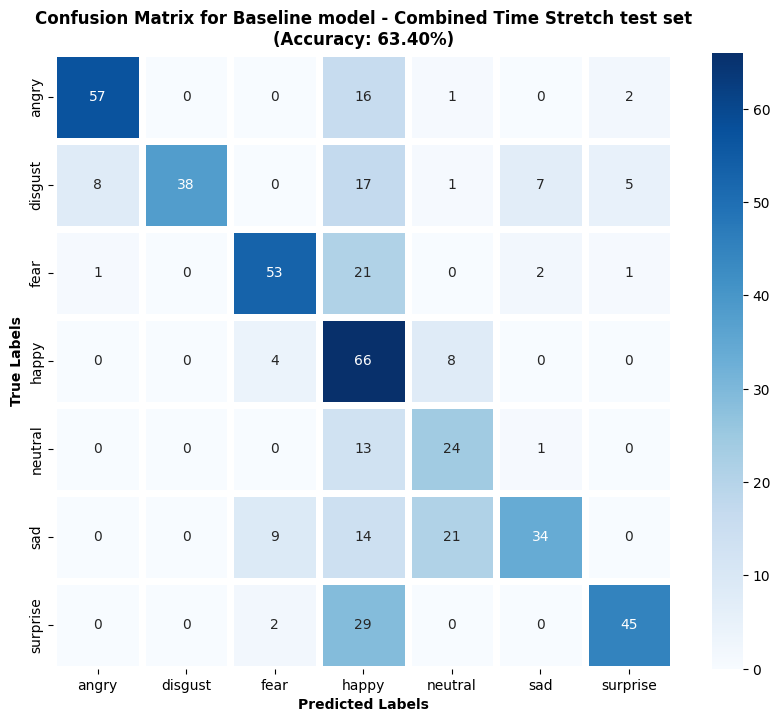


Evaluating Baseline model on Combined SpecAugment dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined SpecAugment: 100%|██████████| 500/500 [00:42<00:00, 11.71it/s, loss=0.431, accuracy=0.726]



=== Results for Combined SpecAugment ===
Final accuracy: 72.6000%

Classification Report for Baseline model on Combined SpecAugment test set:
              precision    recall  f1-score   support

       angry       0.91      0.88      0.89        76
     disgust       1.00      0.59      0.74        76
        fear       0.84      0.78      0.81        78
       happy       0.53      0.79      0.64        78
     neutral       0.45      0.95      0.61        38
         sad       0.84      0.47      0.61        78
    surprise       0.81      0.72      0.76        76

    accuracy                           0.73       500
   macro avg       0.77      0.74      0.72       500
weighted avg       0.79      0.73      0.73       500



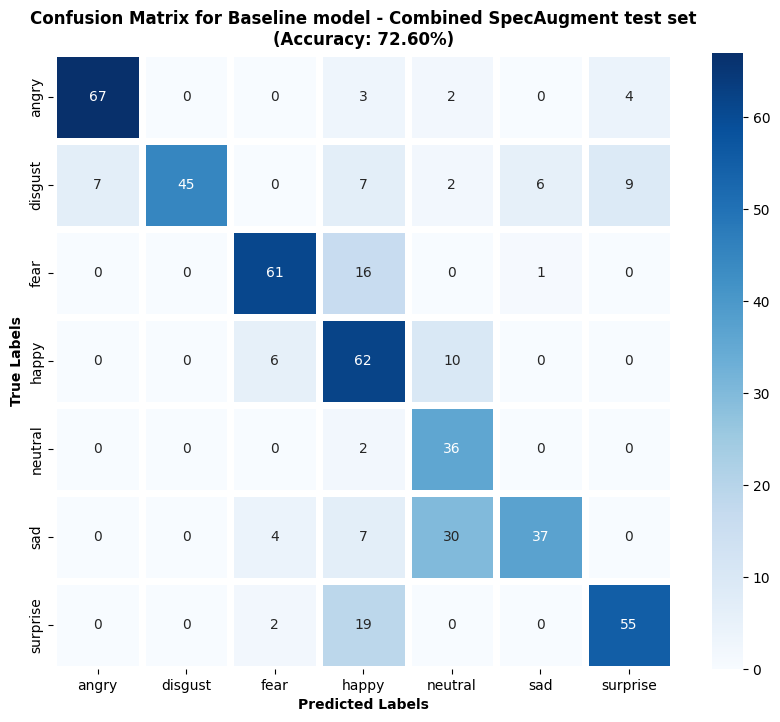


Evaluating Baseline model on Noise dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Noise: 100%|██████████| 250/250 [00:21<00:00, 11.67it/s, loss=0.394, accuracy=0.516]



=== Results for Noise ===
Final accuracy: 51.6000%

Classification Report for Baseline model on Noise test set:
              precision    recall  f1-score   support

       angry       0.92      0.63      0.75        38
     disgust       1.00      0.24      0.38        38
        fear       0.71      0.31      0.43        39
       happy       0.29      0.87      0.44        39
     neutral       0.65      0.58      0.61        19
         sad       0.53      0.72      0.61        39
    surprise       0.92      0.29      0.44        38

    accuracy                           0.52       250
   macro avg       0.72      0.52      0.52       250
weighted avg       0.72      0.52      0.52       250



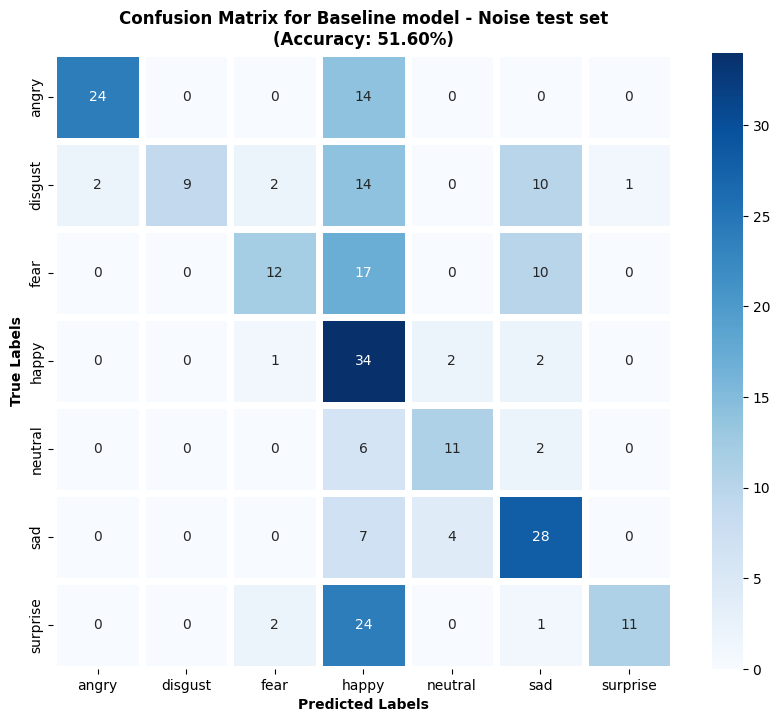


Evaluating Baseline model on NCP dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing NCP: 100%|██████████| 250/250 [00:15<00:00, 16.34it/s, loss=0.092, accuracy=0.396]
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.11/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} 


=== Results for NCP ===
Final accuracy: 39.6000%

Classification Report for Baseline model on NCP test set:
              precision    recall  f1-score   support

       angry       0.66      0.61      0.63        41
     disgust       1.00      0.27      0.42        41
        fear       0.33      0.07      0.12        43
       happy       0.24      0.83      0.38        42
     neutral       0.00      0.00      0.00         0
         sad       0.83      0.12      0.21        42
    surprise       0.74      0.49      0.59        41

    accuracy                           0.40       250
   macro avg       0.54      0.34      0.33       250
weighted avg       0.63      0.40      0.39       250



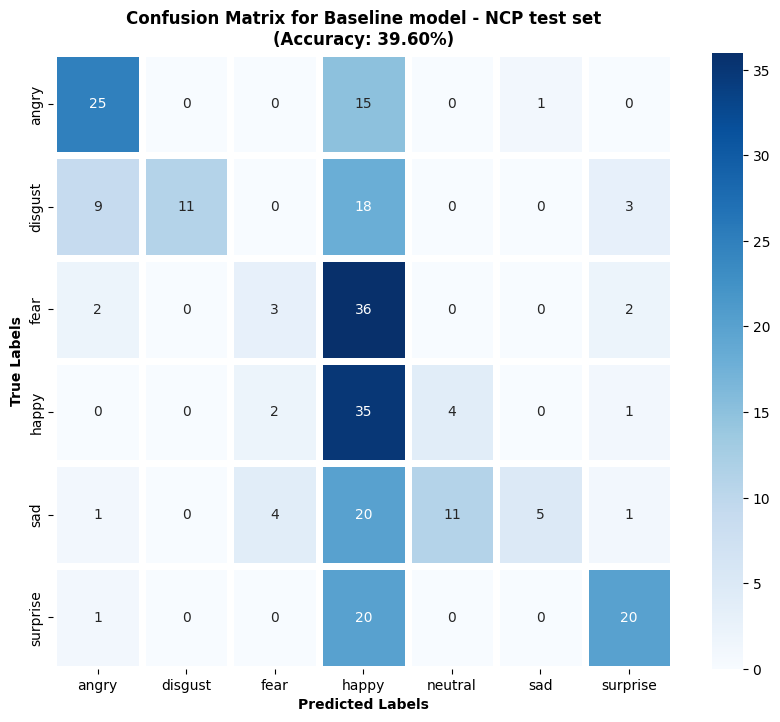


Evaluating Baseline model on Combined NCP dataset...


Map:   0%|          | 0/500 [00:00<?, ? examples/s]

Testing Combined NCP: 100%|██████████| 500/500 [00:43<00:00, 11.41it/s, loss=0.092, accuracy=0.592]



=== Results for Combined NCP ===
Final accuracy: 59.2000%

Classification Report for Baseline model on Combined NCP test set:
              precision    recall  f1-score   support

       angry       0.77      0.73      0.75        79
     disgust       1.00      0.51      0.67        79
        fear       0.77      0.44      0.56        82
       happy       0.34      0.84      0.48        81
     neutral       0.38      0.95      0.54        19
         sad       0.93      0.33      0.49        81
    surprise       0.82      0.62      0.71        79

    accuracy                           0.59       500
   macro avg       0.71      0.63      0.60       500
weighted avg       0.75      0.59      0.61       500



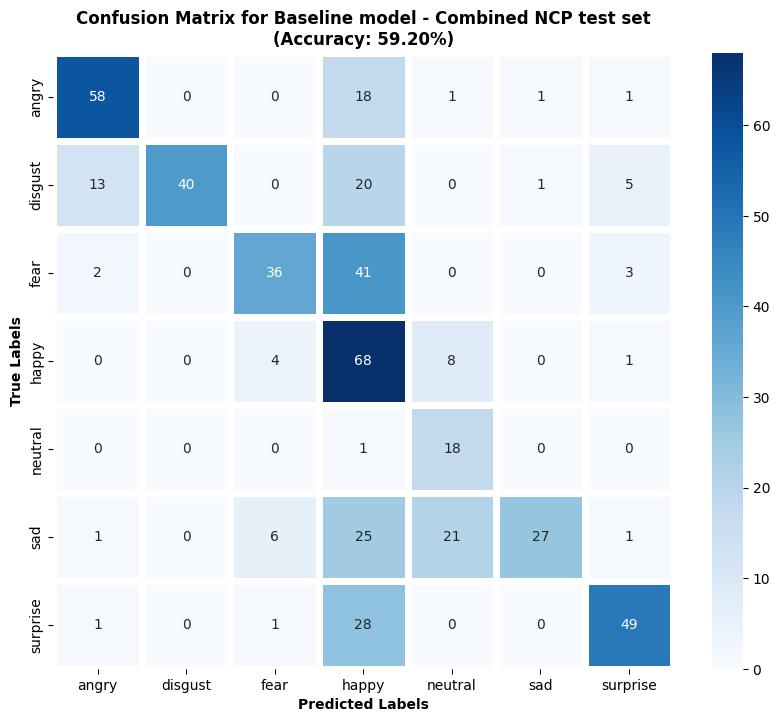


Evaluating Baseline model on Clean dataset...


Map:   0%|          | 0/250 [00:00<?, ? examples/s]

Testing Clean: 100%|██████████| 250/250 [00:21<00:00, 11.83it/s, loss=0.389, accuracy=0.740]



=== Results for Clean ===
Final accuracy: 74.0000%

Classification Report for Baseline model on Clean test set:
              precision    recall  f1-score   support

       angry       0.92      0.89      0.91        38
     disgust       1.00      0.63      0.77        38
        fear       0.84      0.79      0.82        39
       happy       0.55      0.79      0.65        39
     neutral       0.45      0.95      0.61        19
         sad       0.86      0.49      0.62        39
    surprise       0.82      0.74      0.78        38

    accuracy                           0.74       250
   macro avg       0.78      0.76      0.74       250
weighted avg       0.80      0.74      0.75       250



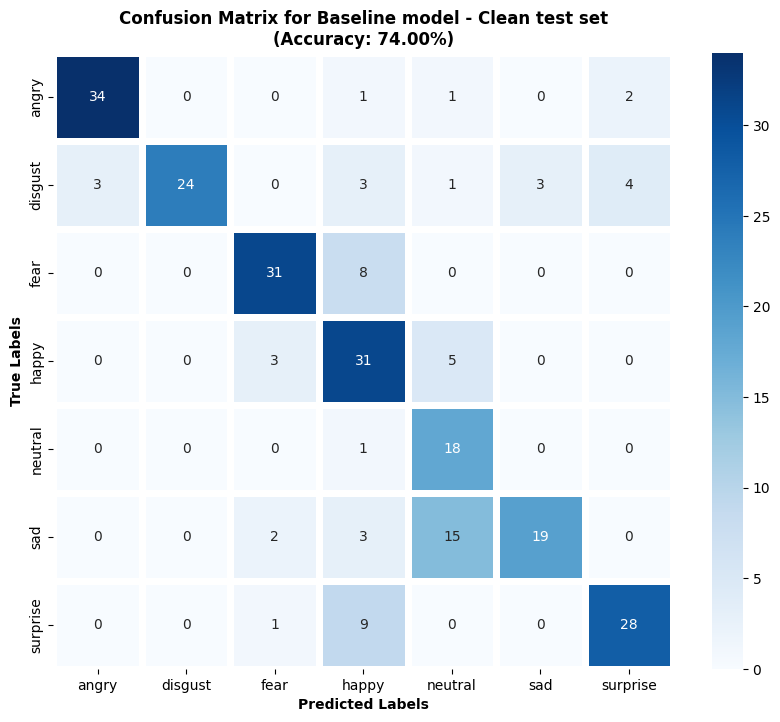

In [10]:
model_path = f"{BASE_DIR}/Stage 1 - baseline creation"
model = HubertForSequenceClassification.from_pretrained(model_path)
feature_extractor = Wav2Vec2FeatureExtractor.from_pretrained(model_path)
model.to(device)
model_name = "Baseline"
# Evaluate on test sets
for set_name, test_data in loaded_test_sets.items():
  print(f"\nEvaluating {model_name} model on {set_name} dataset...")
  accuracy, df_record = evaluate_test_set(
          model,
          model_name,
          test_data,
          set_name,
          device,
          feature_extractor
    )